## Of Genomes and Genetics

There is evidence that suggests the frequency of mutations (genetic conditions) in humans is
increasing over time as our population continues to grow. Therefore, it is important that we work to
understand and analyse these mutations to improve outcomes for patients through the use of
genetic screening tests and patient diagnosis.
This dataset contains information on children with a known genetic condition. Genetic conditions
can be inherited (passed down) from either the mother, father or both parents. They can also
appear spontaneously in the child without either parent having the condition (De Novo mutation). In this dataset, only inherited conditions are considered.

There are five main inheritance patterns:

- Autosomal dominant
- Autosomal recessive
- X-linked dominant
- X-linked recessive
- Mitochondrial

Heritability is complex and affected by multiple aspects. A genetic disorder can be inherited from either or both parents, it can be caused by one or multiple genes and environmental factors also play a role making this a complex problem for machine learning.

# Genetic conditions present in the dataset:
1) Mitochondrial genetic inheritance disorders

Disease is caused by changes in the mitochondrial or nuclear DNA. Mitochondrial changes are only
inherited from the mother. Nuclear DNA changes are inherited through standard inheritance
pathways from either parent.

2) Single gene inheritance disorders

When a disease is caused by a mutation in a single gene. Different mutations in the same gene can
lead to the same disease.

3) Multifactorial genetic inheritance disorders

Conditions caused by many contributing factors. They are influenced by multiple genes (polygenic) as
well as lifestyle and environmental factors.

# Subclasses of genetic conditions in the dataset:
- Leigh syndrome
- Mitochondrial myopathy
- Cystic fibrosis
- Tay-Sachs
- Diabetes
- Hemochromatosis
- Leber’s hereditary optic neuropathy
- Alzheimer’s
- Cancer

# Business perspective

The goal is to be able to predict the genetic disorder (and disorder subclass) a child has, based on
whether the parents have (or are carriers of) the condition, the child’s symptoms and environmental contributing factors. This could help medical
professionals with their diagnosis of genetic and inherited conditions in patients. This information
would in turn assist them in treating these patients.

# Data description, sources and quality

Dataset is from Kaggle which sourced it from HackerEarth Machine Learning challenge. Original
source unknown.

Dataset contains a training set of 22083 records and 45 columns. Test dataset contains 9465 records
and 45 columns. There is also a sample_submission file with 5 rows and 3 columns. 

There is a reasonable amount of missing data.

# Description of features

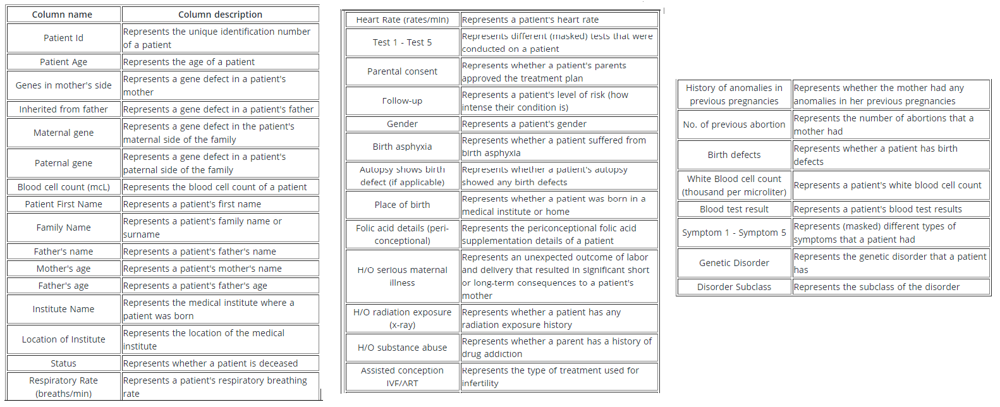

# Previous results achieved for this dataset

- Random forest = 0.603
- Boosting (LGBM) = 0.686
- KNN = 0.788
- SVM (rbf kernel and C = 100) = 0.954

(from kaggle notebooks)

# Question

- Which genetic disorder does a patient have?


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics as met
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import svm, feature_selection

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, train_test_split, cross_val_predict, GridSearchCV
from sklearn.naive_bayes import GaussianNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import precision_score, f1_score, recall_score, roc_auc_score, accuracy_score
from keras.utils import to_categorical


from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.naive_bayes import GaussianNB
from mlxtend.plotting import plot_learning_curves
from sklearn.metrics import accuracy_score
from sklearn.utils import shuffle
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

2023-04-17 17:38:08.181639: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-17 17:38:08.396312: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-04-17 17:38:08.396337: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-04-17 17:38:09.451915: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-04-1

In [2]:
# import train dataset
# data was used for a competition, meaning test dataset has had labels removed.
# previous notebooks have worked only with the training dataset, will do the same here as will be more comparable with 
# other results.

gen_train = pd.read_csv("train.csv")

gen_train.head()

,Patient Id,Patient Age,Genes in mother's side,Inherited from father,Maternal gene,Paternal gene,Blood cell count (mcL),Patient First Name,Family Name,Father's name,...,Birth defects,White Blood cell count (thousand per microliter),Blood test result,Symptom 1,Symptom 2,Symptom 3,Symptom 4,Symptom 5,Genetic Disorder,Disorder Subclass
0,PID0x6418,2.0,Yes,No,Yes,No,4.760603,Richard,NaN,Larre,...,NaN,9.857562,NaN,1.0,1.0,1.0,1.0,1.0,Mitochondrial genetic inheritance disorders,Leber's hereditary optic neuropathy
1,PID0x25d5,4.0,Yes,Yes,No,No,4.910669,Mike,NaN,Brycen,...,Multiple,5.522560,normal,1.0,NaN,1.0,1.0,0.0,NaN,Cystic fibrosis
2,PID0x4a82,6.0,Yes,No,No,No,4.893297,Kimberly,NaN,Nashon,...,Singular,NaN,normal,0.0,1.0,1.0,1.0,1.0,Multifactorial genetic inheritance disorders,Diabetes
3,PID0x4ac8,12.0,Yes,No,Yes,No,4.705280,Jeffery,Hoelscher,Aayaan,...,Singular,7.919321,inconclusive,0.0,0.0,1.0,0.0,0.0,Mitochondrial genetic inheritance disorders,Leigh syndrome
4,PID0x1bf7,11.0,Yes,No,NaN,Yes,4.720703,Johanna,Stutzman,Suave,...,Multiple,4.098210,NaN,0.0,0.0,0.0,0.0,NaN,Multifactorial genetic inheritance disorders,Cancer


In [3]:
# Based on an initial look inside categories in features, function to replace different versions of missing records with NaN

def missing_to_NaN(data_set):
    data_set["Birth asphyxia"] = data_set["Birth asphyxia"].replace("No record", np.NaN)
    data_set["Birth asphyxia"] = data_set["Birth asphyxia"].replace("Not available", np.NaN)

    data_set["Autopsy shows birth defect (if applicable)"] = data_set["Autopsy shows birth defect (if applicable)"].replace("None", np.NaN)
    data_set["Autopsy shows birth defect (if applicable)"] = data_set["Autopsy shows birth defect (if applicable)"].replace("Not applicable",\
                                                                                                                             np.NaN)

    data_set["H/O radiation exposure (x-ray)"] = data_set["H/O radiation exposure (x-ray)"].replace("Not applicable", np.NaN)
    data_set["H/O radiation exposure (x-ray)"] = data_set["H/O radiation exposure (x-ray)"].replace("-", np.NaN)

    data_set["H/O substance abuse"] = data_set["H/O substance abuse"].replace("Not applicable", np.NaN)
    data_set["H/O substance abuse"] = data_set["H/O substance abuse"].replace("-",np. NaN)

# ref 4

In [4]:
# run function to convert to NaNs for both training and test datasets

missing_to_NaN(gen_train)


In [5]:
# Drop columns which contain no valuable information

gen_train = gen_train.drop(['Patient First Name', 'Family Name', 'Father\'s name', \
                             'Patient First Name', 'Parental consent','Patient Id', \
                              'Institute Name', 'Location of Institute', "Test 1",
                    "Test 2", "Test 3", "Test 4", "Test 5"], axis=1)

# Columns test 1 to test 5 are just empty columns with 0s and NaNs
# Parental consent = all yes that they gave their consent. No relevant feature information


In [6]:
gen_train.head()

,Patient Age,Genes in mother's side,Inherited from father,Maternal gene,Paternal gene,Blood cell count (mcL),Mother's age,Father's age,Status,Respiratory Rate (breaths/min),...,Birth defects,White Blood cell count (thousand per microliter),Blood test result,Symptom 1,Symptom 2,Symptom 3,Symptom 4,Symptom 5,Genetic Disorder,Disorder Subclass
0,2.0,Yes,No,Yes,No,4.760603,NaN,NaN,Alive,Normal (30-60),...,NaN,9.857562,NaN,1.0,1.0,1.0,1.0,1.0,Mitochondrial genetic inheritance disorders,Leber's hereditary optic neuropathy
1,4.0,Yes,Yes,No,No,4.910669,NaN,23.0,Deceased,Tachypnea,...,Multiple,5.522560,normal,1.0,NaN,1.0,1.0,0.0,NaN,Cystic fibrosis
2,6.0,Yes,No,No,No,4.893297,41.0,22.0,Alive,Normal (30-60),...,Singular,NaN,normal,0.0,1.0,1.0,1.0,1.0,Multifactorial genetic inheritance disorders,Diabetes
3,12.0,Yes,No,Yes,No,4.705280,21.0,NaN,Deceased,Tachypnea,...,Singular,7.919321,inconclusive,0.0,0.0,1.0,0.0,0.0,Mitochondrial genetic inheritance disorders,Leigh syndrome
4,11.0,Yes,No,NaN,Yes,4.720703,32.0,NaN,Alive,Tachypnea,...,Multiple,4.098210,NaN,0.0,0.0,0.0,0.0,NaN,Multifactorial genetic inheritance disorders,Cancer


In [7]:
# check for any duplicates in the datasets

print(f'Duplicated values training set: \n\n {gen_train.duplicated().sum()}')


Duplicated values training set: 

 0


In [8]:
# what columns have we got now?
gen_train.columns

Index(['Patient Age', 'Genes in mother's side', 'Inherited from father',
       'Maternal gene', 'Paternal gene', 'Blood cell count (mcL)',
       'Mother's age', 'Father's age', 'Status',
       'Respiratory Rate (breaths/min)', 'Heart Rate (rates/min', 'Follow-up',
       'Gender', 'Birth asphyxia',
       'Autopsy shows birth defect (if applicable)', 'Place of birth',
       'Folic acid details (peri-conceptional)',
       'H/O serious maternal illness', 'H/O radiation exposure (x-ray)',
       'H/O substance abuse', 'Assisted conception IVF/ART',
       'History of anomalies in previous pregnancies',
       'No. of previous abortion', 'Birth defects',
       'White Blood cell count (thousand per microliter)', 'Blood test result',
       'Symptom 1', 'Symptom 2', 'Symptom 3', 'Symptom 4', 'Symptom 5',
       'Genetic Disorder', 'Disorder Subclass'],
      dtype='object')

In [9]:
# rename columns training set

gen_train.rename(columns={"Patient Age": "Patient_Age",
                    "Genes in mother's side": "Genes_Mother_Side",
                    "Maternal gene": "Maternal_Gene",
                    "Paternal gene": "Paternal_Gene",
                    "Blood cell count (mcL)": "Blood_Cell_mcL",
                    "Mother's age": "Mother_Age",
                    "Father's age": "Father_Age",
                    "Inherited from father": "Inherited_From_Father",
                    "Respiratory Rate (breaths/min)": "Respiratory_Rate_Breaths_Min",
                    "Heart Rate (rates/min": "Heart_Rates_Min",
                    "Parental consent": "Parental_Consent",
                    "Follow-up": "Follow_Up",
                    "Birth asphyxia": "Birth_Asphyxia",
                    "Autopsy shows birth defect (if applicable)": "Autopsy_Birth_Defect",
                    "Place of birth": "Place_Birth",
                    "Folic acid details (peri-conceptional)": "Folic_Acid",
                    "H/O serious maternal illness": "Maternal_Illness",
                    "H/O radiation exposure (x-ray)": "Radiation_Exposure",
                    "H/O substance abuse": "Substance_Abuse",
                    "Assisted conception IVF/ART": "Assisted_Conception",
                    "History of anomalies in previous pregnancies": "History_Previous_Pregnancies",
                    "No. of previous abortion": "Previous_Abortion",
                    "Birth defects": "Birth_Defects",
                    "White Blood cell count (thousand per microliter)": "White_Blood_Cell",
                    "Blood test result": "Blood_Test_Result",
                    "Genetic Disorder": "Genetic_Disorder",
                    "Disorder Subclass": "Disorder_Subclass",
                    "Symptom 1": "Symptom_1",
                    "Symptom 2": "Symptom_2",
                    "Symptom 3": "Symptom_3",
                    "Symptom 4": "Symptom_4",
                    "Symptom 5": "Symptom_5"},inplace=True)

# Exploratory data analysis

In [147]:
gen_train.shape

(22083, 33)

In [148]:
gen_train.dtypes

Patient_Age                     float64
Genes_Mother_Side                object
Inherited_From_Father            object
Maternal_Gene                    object
Paternal_Gene                    object
Blood_Cell_mcL                  float64
Mother_Age                      float64
Father_Age                      float64
Status                           object
Respiratory_Rate_Breaths_Min     object
Heart_Rates_Min                  object
Follow_Up                        object
Gender                           object
Birth_Asphyxia                   object
Autopsy_Birth_Defect             object
Place_Birth                      object
Folic_Acid                       object
Maternal_Illness                 object
Radiation_Exposure               object
Substance_Abuse                  object
Assisted_Conception              object
History_Previous_Pregnancies     object
Previous_Abortion               float64
Birth_Defects                    object
White_Blood_Cell                float64


In [10]:
gen_train.isnull().sum()

Patient_Age                      1427
Genes_Mother_Side                   0
Inherited_From_Father             306
Maternal_Gene                    2810
Paternal_Gene                       0
Blood_Cell_mcL                      0
Mother_Age                       6036
Father_Age                       5986
Status                              0
Respiratory_Rate_Breaths_Min     2149
Heart_Rates_Min                  2113
Follow_Up                        2166
Gender                           2173
Birth_Asphyxia                  12133
Autopsy_Birth_Defect            15475
Place_Birth                      2124
Folic_Acid                       2117
Maternal_Illness                 2152
Radiation_Exposure              12098
Substance_Abuse                 12075
Assisted_Conception              2122
History_Previous_Pregnancies     2172
Previous_Abortion                2162
Birth_Defects                    2154
White_Blood_Cell                 2148
Blood_Test_Result                2145
Symptom_1   

In [11]:
## Check data
dataset = gen_train

# About Athlete dataset
print('Dataset is a %s' % type(dataset))
print('Dataset has %d rows and %d columns' % dataset.shape)
print('Basic Statistics about dataset%s' % ('_'*50))
print(dataset.describe())

Dataset is a <class 'pandas.core.frame.DataFrame'>
Dataset has 22083 rows and 33 columns
Basic Statistics about dataset__________________________________________________
        Patient_Age  Blood_Cell_mcL    Mother_Age    Father_Age  \
count  20656.000000    22083.000000  16047.000000  16097.000000   
mean       6.974148        4.898871     34.526454     41.972852   
std        4.319475        0.199663      9.852598     13.035501   
min        0.000000        4.092727     18.000000     20.000000   
25%        3.000000        4.763109     26.000000     31.000000   
50%        7.000000        4.899399     35.000000     42.000000   
75%       11.000000        5.033830     43.000000     53.000000   
max       14.000000        5.609829     51.000000     64.000000   

       Previous_Abortion  White_Blood_Cell     Symptom_1     Symptom_2  \
count       19921.000000      19935.000000  19928.000000  19861.000000   
mean            2.003062          7.486224      0.592483      0.551886   
std 

In [9]:
gen_train.corr(numeric_only = True)

,Patient_Age,Blood_Cell_mcL,Mother_Age,Father_Age,Previous_Abortion,White_Blood_Cell,Symptom_1,Symptom_2,Symptom_3,Symptom_4,Symptom_5
Patient_Age,1.000000,0.010819,-0.007588,-0.009797,-0.007281,-0.008489,0.003335,0.007506,-0.018755,-0.007470,-0.014463
Blood_Cell_mcL,0.010819,1.000000,-0.007163,0.003303,-0.005995,-0.001037,0.005793,-0.003913,0.006519,0.005341,0.002281
Mother_Age,-0.007588,-0.007163,1.000000,-0.000336,0.007844,0.015443,-0.006920,-0.012243,0.008079,-0.009321,0.011743
Father_Age,-0.009797,0.003303,-0.000336,1.000000,0.000539,0.012954,0.005452,-0.003314,0.012519,-0.001118,0.011630
Previous_Abortion,-0.007281,-0.005995,0.007844,0.000539,1.000000,0.003807,-0.007495,0.007169,-0.000746,0.003735,-0.004264
White_Blood_Cell,-0.008489,-0.001037,0.015443,0.012954,0.003807,1.000000,0.000442,0.008489,0.008472,0.001592,-0.013023
Symptom_1,0.003335,0.005793,-0.006920,0.005452,-0.007495,0.000442,1.000000,0.002014,0.005559,-0.000530,0.015840
Symptom_2,0.007506,-0.003913,-0.012243,-0.003314,0.007169,0.008489,0.002014,1.000000,0.008689,0.014627,0.011601
Symptom_3,-0.018755,0.006519,0.008079,0.012519,-0.000746,0.008472,0.005559,0.008689,1.000000,0.002794,0.028203
Symptom_4,-0.007470,0.005341,-0.009321,-0.001118,0.003735,0.001592,-0.000530,0.014627,0.002794,1.000000,0.036785


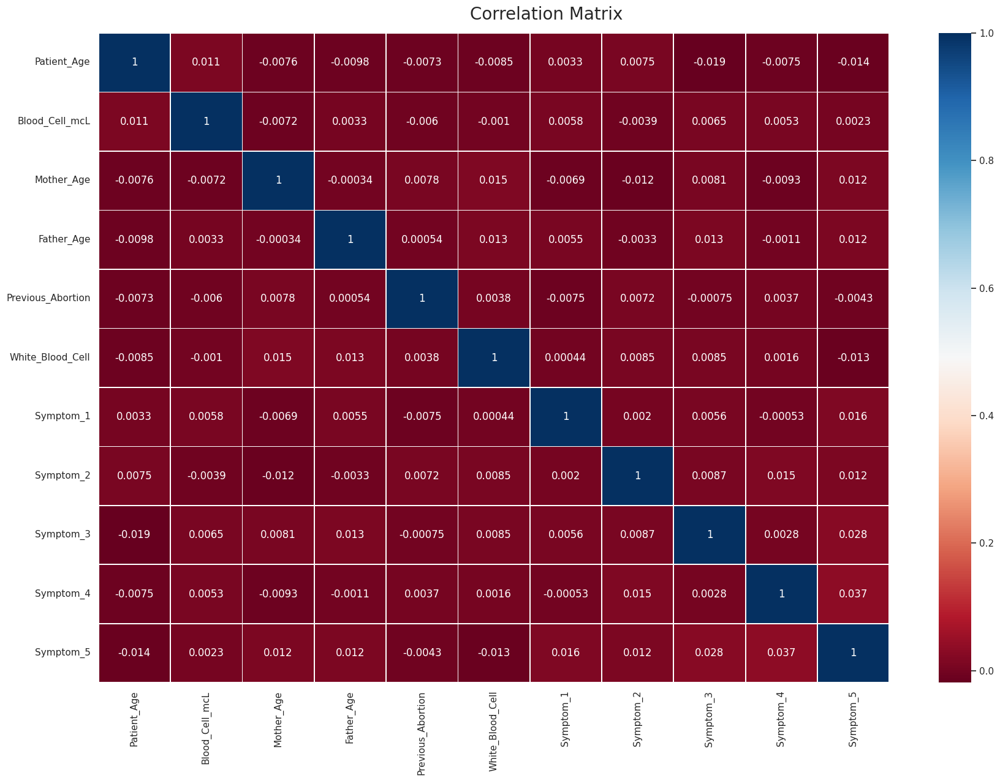

In [153]:
# correlation heatmap

colormap = plt.cm.RdBu
#colormap = "YlGnBu"

plt.subplots(figsize = (18,13))
sns.set(font_scale = 1)

hmap = sns.heatmap(data = gen_train.corr(numeric_only = True),
            annot = True,
            linewidths = .5,
            cmap = colormap
            )

plt.suptitle("Correlation Matrix", fontsize = 20)
plt.tight_layout()

# All the features have a low correlation

In [24]:
# correlations with target feature - genetic disorder

gen_corrs = gen_train.corr(numeric_only = True)

print(gen_corrs['Genetic_Disorder'].sort_values(ascending = False))

Genetic_Disorder                1.000000
Disorder_Subclass               0.704920
Symptom_5                       0.150526
Symptom_4                       0.114292
Symptom_3                       0.110666
Symptom_2                       0.072417
Genes_Mother_Side               0.059710
Symptom_1                       0.058723
Inherited_From_Father           0.054088
Paternal_Gene                   0.052213
Maternal_Gene                   0.043584
Blood_Test_Result               0.018123
Follow_Up                       0.012882
Father_Age                      0.011339
Gender_Ambiguous                0.009318
Heart_Rates_Min                 0.006238
Respiratory_Rate_Breaths_Min    0.005866
White_Blood_Cell                0.005165
Gender_Male                     0.004485
Folic_Acid                      0.004260
Assisted_Conception             0.003812
Place_Birth                     0.001223
Mother_Age                      0.001016
Maternal_Illness                0.000697
Patient_Age     

In [193]:
# visualise features in pairs
sns.pairplot(gen_train, hue='Genetic_Disorder')
plt.show()

# Can see 2 peaks for most of the features showing separation between the 2 predominant genetic disorder classes in the dataset

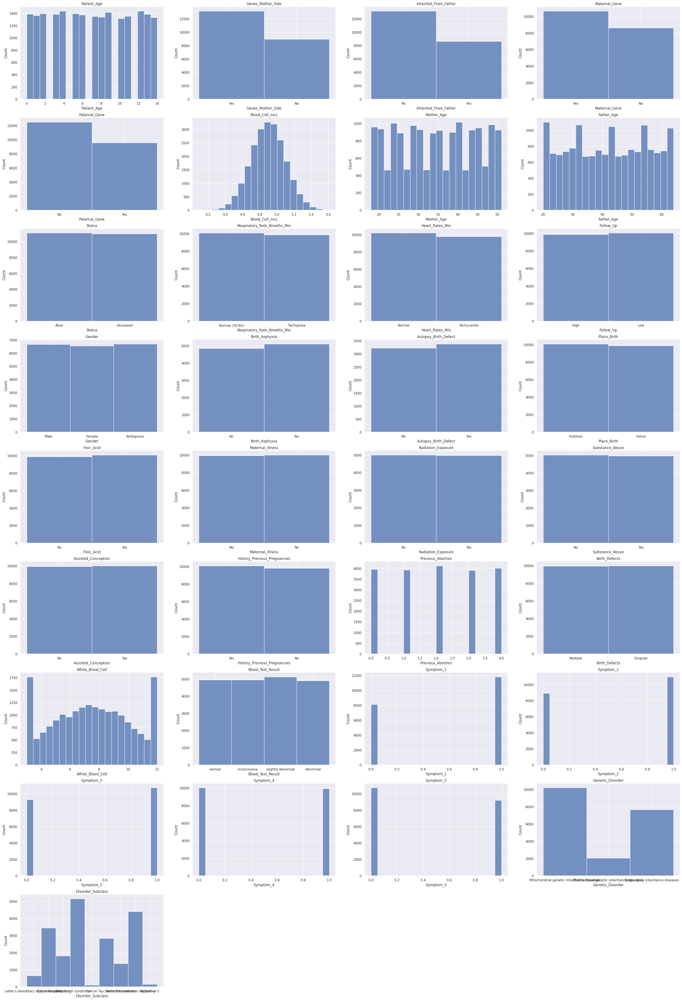

In [155]:
# sns distribution plots 
dat = gen_train
N_col = dat.columns

plt.figure(figsize=(40,80), facecolor='white')
plotnum=1
for col in N_col:
    ax=plt.subplot(12,4,plotnum)
    sns.histplot(dat[col], bins=20)
    plt.title(col)
    plotnum+=1
plt.show()


In [7]:
disorder = pd.DataFrame(gen_train['Genetic_Disorder'].value_counts())

disorder

,Genetic_Disorder
Mitochondrial genetic inheritance disorders,10202
Single-gene inheritance diseases,7664
Multifactorial genetic inheritance disorders,2071


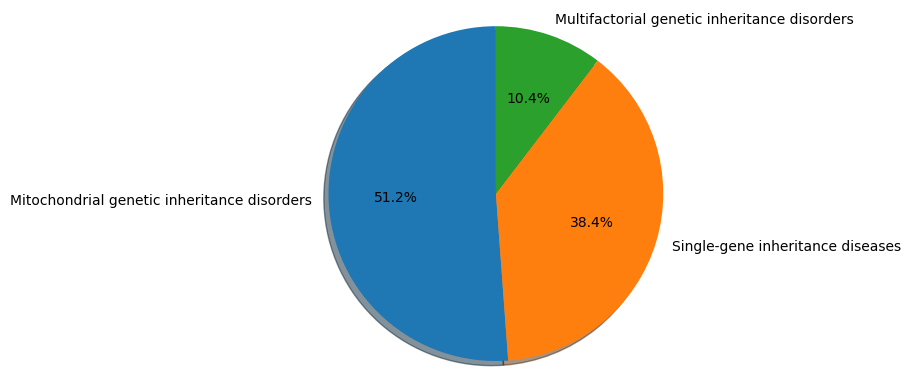

In [8]:
# frequency of some observations using pie chart - use to show the proportion of genetic disorders

labels = 'Mitochondrial genetic inheritance disorders', 'Single-gene inheritance diseases', 'Multifactorial genetic inheritance disorders'
frequency = disorder['Genetic_Disorder']
fig1, ax1 = plt.subplots()
explode = (0, 0, 0)
ax1.pie(frequency, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')
plt.show()

In [9]:
disorder2 = pd.DataFrame(gen_train['Disorder_Subclass'].value_counts())

disorder2

,Disorder_Subclass
Leigh syndrome,5160
Mitochondrial myopathy,4405
Cystic fibrosis,3448
Tay-Sachs,2833
Diabetes,1817
Hemochromatosis,1355
Leber's hereditary optic neuropathy,648
Alzheimer's,152
Cancer,97


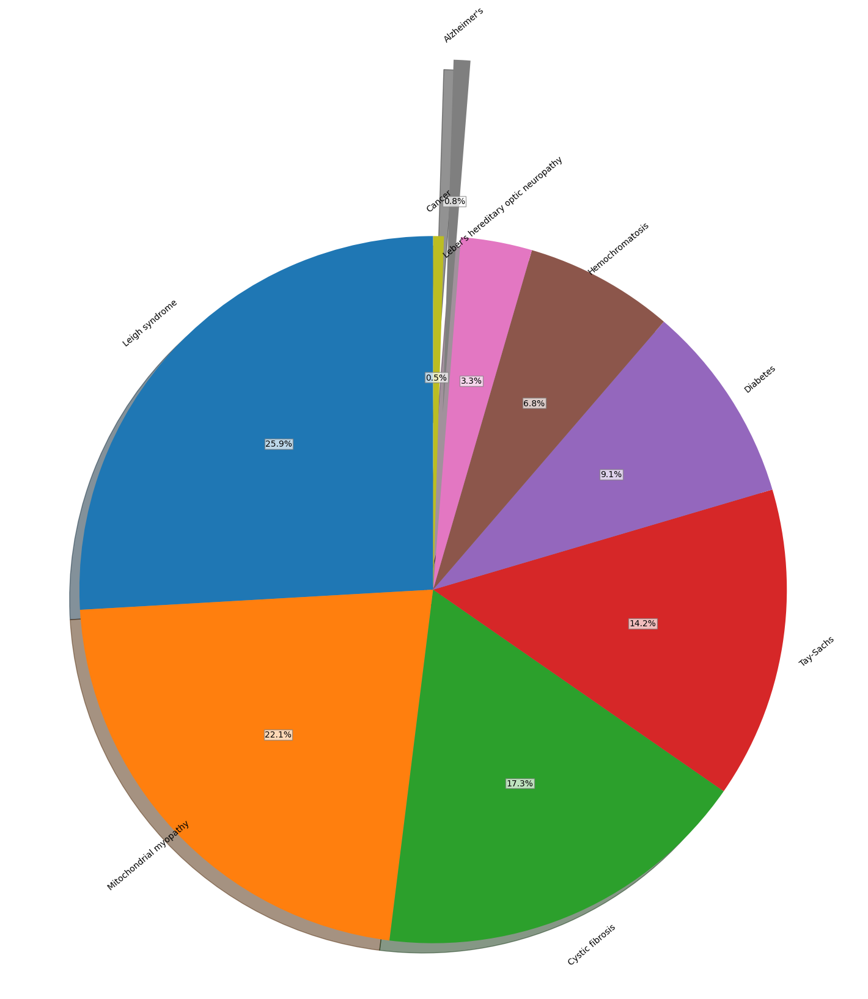

In [10]:
# frequency of some observations using pie chart - use to show the proportion of genetic disorders - subgroups

labels = 'Leigh syndrome', 'Mitochondrial myopathy', 'Cystic fibrosis', 'Tay-Sachs', 'Diabetes', \
'Hemochromatosis', 'Leber\'s hereditary optic neuropathy', 'Alzheimer\'s', 'Cancer'
frequency = disorder2['Disorder_Subclass']

# plot
fig, ax = plt.subplots(figsize=(20, 16)) # adjust size of chart
fig.subplots_adjust(0.3,0,1,1)
explode = (0, 0, 0, 0, 0, 0, 0, 0.5, 0)
wedges, texts, autotexts = ax.pie(frequency, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90, textprops={'fontsize': 10}) # adjust font size of labels

# add bounding box around percentage labels
for autotext in autotexts:
    autotext.set_bbox({'facecolor': 'white', 'edgecolor': 'gray', 'pad': 1, 'alpha': 0.7})

# rotate labels
for text in texts:
    angle = 40 # get the position and rotation of the label
    text.set_rotation(angle) # set the rotation of the label
    text.set_horizontalalignment('center')
    
# adjust autopct labels
for autotext in autotexts:
    autotext.set_horizontalalignment('center')
    autotext.set_verticalalignment('center')


ax.axis('equal')
plt.show()

# ref 1 & 2 & 3

# Clean and prepare data

Encoding the text variables

In [160]:
gen_train.columns

Index(['Patient_Age', 'Genes_Mother_Side', 'Inherited_From_Father',
       'Maternal_Gene', 'Paternal_Gene', 'Blood_Cell_mcL', 'Mother_Age',
       'Father_Age', 'Status', 'Respiratory_Rate_Breaths_Min',
       'Heart_Rates_Min', 'Follow_Up', 'Gender', 'Birth_Asphyxia',
       'Autopsy_Birth_Defect', 'Place_Birth', 'Folic_Acid', 'Maternal_Illness',
       'Radiation_Exposure', 'Substance_Abuse', 'Assisted_Conception',
       'History_Previous_Pregnancies', 'Previous_Abortion', 'Birth_Defects',
       'White_Blood_Cell', 'Blood_Test_Result', 'Symptom_1', 'Symptom_2',
       'Symptom_3', 'Symptom_4', 'Symptom_5', 'Genetic_Disorder',
       'Disorder_Subclass'],
      dtype='object')

In [7]:
# get value counts and options in each feature that need to be encoded

for col in gen_train.columns:
    print(f'value count for {col}: \n\n {gen_train[col].value_counts()} \n\n')

value count for Patient_Age: 

 4.0     1435
12.0    1435
9.0     1415
2.0     1396
5.0     1394
0.0     1386
13.0    1384
3.0     1383
6.0     1374
1.0     1364
11.0    1353
7.0     1351
8.0     1340
14.0    1333
10.0    1313
Name: Patient_Age, dtype: int64 


value count for Genes_Mother_Side: 

 Yes    13143
No      8940
Name: Genes_Mother_Side, dtype: int64 


value count for Inherited_From_Father: 

 No     13133
Yes     8644
Name: Inherited_From_Father, dtype: int64 


value count for Maternal_Gene: 

 Yes    10647
No      8626
Name: Maternal_Gene, dtype: int64 


value count for Paternal_Gene: 

 No     12508
Yes     9575
Name: Paternal_Gene, dtype: int64 


value count for Blood_Cell_mcL: 

 4.760603    1
4.800413    1
4.874316    1
4.592124    1
5.190047    1
           ..
5.128740    1
4.769116    1
4.916183    1
4.717727    1
4.738067    1
Name: Blood_Cell_mcL, Length: 22083, dtype: int64 


value count for Mother_Age: 

 23.0    525
19.0    516
40.0    515
47.0    508
28.0 

In [162]:
# While we don't have any information on what the symptoms are in this case. We do know that the patients have been recorded as either
# having or not having each of the symptoms. Given this, these features could be useful as there would likely be patterns seen 
# between which symptoms are showing and which disease is present.

gen_train['Symptom_1'].value_counts()

1.0    11807
0.0     8121
Name: Symptom_1, dtype: int64

In [12]:
# Remove rows where NaNs are present in target variables

gen_train = gen_train.dropna(subset=['Genetic_Disorder', 'Disorder_Subclass'])

# ref 5

In [12]:
gen_train.shape

# approx. 4000 records had no known genetic disorder and/or disorder subclass listed

(18047, 33)

Encode string variables

In [13]:
# Encode string variables to numeric - with 2 categories
########################################################
# yes/no vars will make yes = 1 and no = 0

vars_w_2_options = ["Maternal_Gene", "Inherited_From_Father", "Folic_Acid", "Autopsy_Birth_Defect",\
                    "Birth_Asphyxia", "Inherited_From_Father", "Maternal_Gene", "Paternal_Gene",\
                    "Genes_Mother_Side", "History_Previous_Pregnancies", "Assisted_Conception", "Substance_Abuse",\
                    "Radiation_Exposure", "Maternal_Illness"]

for impute_var in vars_w_2_options:
    gen_train[impute_var].replace(to_replace=['No', 'Yes'], value=[0, 1], inplace = True)

#################################################
# Place_Birth: institute = 1, home = 0
# follow_up: high = 1, low = 0
# status: alive = 1, deceased = 0

gen_train["Place_Birth"].replace(to_replace=['Home', 'Institute'], value=[0, 1], inplace = True)
gen_train["Follow_Up"].replace(to_replace=['Low', 'High'], value=[0, 1], inplace = True)
gen_train["Status"].replace(to_replace=['Deceased', 'Alive'], value=[0, 1], inplace = True)
gen_train["Birth_Defects"].replace(to_replace=['Singular', 'Multiple'], value=[0, 1], inplace = True)
gen_train["Heart_Rates_Min"].replace(to_replace=['Normal', 'Tachycardia'], value=[0, 1], inplace = True)
gen_train["Respiratory_Rate_Breaths_Min"].replace(to_replace=['Normal (30-60)', 'Tachypnea'], value=[0, 1], inplace = True)

/tmp/ipykernel_11023/3702516452.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gen_train[impute_var].replace(to_replace=['No', 'Yes'], value=[0, 1], inplace = True)
/tmp/ipykernel_11023/3702516452.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gen_train["Place_Birth"].replace(to_replace=['Home', 'Institute'], value=[0, 1], inplace = True)
/tmp/ipykernel_11023/3702516452.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  g

In [14]:
# Encoding features with more than 2 classes:
# Blood test results have an implied order of importance. Abnormal > slightly abnormal > normal > inconclusive 
# in terms of relevance to disease prediction, therefore using ordinal encoding:

gen_train["Blood_Test_Result"].replace(to_replace=['inconclusive', 'normal', 'slightly abnormal',\
                                                    'abnormal'], value=[0, 1, 2, 3], inplace = True)

# Gender has 3 categories - no implied order. Therefore, using one-hot encoding

gen_train = pd.get_dummies(gen_train, columns = ['Gender'])

/tmp/ipykernel_11023/2288905235.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gen_train["Blood_Test_Result"].replace(to_replace=['inconclusive', 'normal', 'slightly abnormal',\


In [15]:
# Encoding the target variables
################################

gen_train["Genetic_Disorder"].replace(to_replace=['Mitochondrial genetic inheritance disorders', 'Single-gene inheritance diseases',\
                                                   'Multifactorial genetic inheritance disorders'], value=[0, 1, 2], inplace = True)


gen_train["Disorder_Subclass"].replace(to_replace=['Leigh syndrome', 'Mitochondrial myopathy', 'Cystic fibrosis', 'Tay-Sachs',\
                                                   'Diabetes', 'Hemochromatosis', 'Leber\'s hereditary optic neuropathy', 'Alzheimer\'s',\
                                                   'Cancer'], value=[0, 1, 2, 3, 4, 5, 6, 7, 8], inplace = True)



In [16]:
gen_train.head()

,Patient_Age,Genes_Mother_Side,Inherited_From_Father,Maternal_Gene,Paternal_Gene,Blood_Cell_mcL,Mother_Age,Father_Age,Status,Respiratory_Rate_Breaths_Min,...,Symptom_1,Symptom_2,Symptom_3,Symptom_4,Symptom_5,Genetic_Disorder,Disorder_Subclass,Gender_Ambiguous,Gender_Female,Gender_Male
0,2.0,1,0.0,1.0,0,4.760603,NaN,NaN,1,0.0,...,1.0,1.0,1.0,1.0,1.0,0,6,0,0,0
2,6.0,1,0.0,0.0,0,4.893297,41.0,22.0,1,0.0,...,0.0,1.0,1.0,1.0,1.0,2,4,0,0,0
3,12.0,1,0.0,1.0,0,4.705280,21.0,NaN,0,1.0,...,0.0,0.0,1.0,0.0,0.0,0,0,0,0,1
4,11.0,1,0.0,NaN,1,4.720703,32.0,NaN,1,1.0,...,0.0,0.0,0.0,0.0,NaN,2,8,0,0,1
5,14.0,1,0.0,1.0,0,5.103188,NaN,NaN,0,NaN,...,1.0,0.0,0.0,1.0,0.0,1,2,0,1,0


In [17]:
# Check that every column is now numeric
gen_train.dtypes

Patient_Age                     float64
Genes_Mother_Side                 int64
Inherited_From_Father           float64
Maternal_Gene                   float64
Paternal_Gene                     int64
Blood_Cell_mcL                  float64
Mother_Age                      float64
Father_Age                      float64
Status                            int64
Respiratory_Rate_Breaths_Min    float64
Heart_Rates_Min                 float64
Follow_Up                       float64
Birth_Asphyxia                  float64
Autopsy_Birth_Defect            float64
Place_Birth                     float64
Folic_Acid                      float64
Maternal_Illness                float64
Radiation_Exposure              float64
Substance_Abuse                 float64
Assisted_Conception             float64
History_Previous_Pregnancies    float64
Previous_Abortion               float64
Birth_Defects                   float64
White_Blood_Cell                float64
Blood_Test_Result               float64


Check percentages of missing data in each feature

In [18]:
## Implementing Missing value ratio technique - remove feautures with too much missing data
# Calculate the percentage of missing data in each column and remove columns where missing data % is above given threshold
# missing = NaN

data = gen_train

# Create new dataframe
# saving missing values in a variable
a = data.isnull().sum()/len(data)*100

# saving column names in a variable
variables = data.columns

# new variable to store variables having missing values less than a threshold

variable = [ ]

for i in range(data.columns.shape[0]):
    if a[i]<=40: #setting the threshold as 40%
        variable.append(variables[i])

# creating a new dataframe using the above variables

gen_train = data[variable]
gen_train.head()

# code from ref 6

,Patient_Age,Genes_Mother_Side,Inherited_From_Father,Maternal_Gene,Paternal_Gene,Blood_Cell_mcL,Mother_Age,Father_Age,Status,Respiratory_Rate_Breaths_Min,...,Symptom_1,Symptom_2,Symptom_3,Symptom_4,Symptom_5,Genetic_Disorder,Disorder_Subclass,Gender_Ambiguous,Gender_Female,Gender_Male
0,2.0,1,0.0,1.0,0,4.760603,NaN,NaN,1,0.0,...,1.0,1.0,1.0,1.0,1.0,0,6,0,0,0
2,6.0,1,0.0,0.0,0,4.893297,41.0,22.0,1,0.0,...,0.0,1.0,1.0,1.0,1.0,2,4,0,0,0
3,12.0,1,0.0,1.0,0,4.705280,21.0,NaN,0,1.0,...,0.0,0.0,1.0,0.0,0.0,0,0,0,0,1
4,11.0,1,0.0,NaN,1,4.720703,32.0,NaN,1,1.0,...,0.0,0.0,0.0,0.0,NaN,2,8,0,0,1
5,14.0,1,0.0,1.0,0,5.103188,NaN,NaN,0,NaN,...,1.0,0.0,0.0,1.0,0.0,1,2,0,1,0


In [19]:
# See the % of missing values for each column
# 4 features removed
a

Patient_Age                      5.873552
Genes_Mother_Side                0.000000
Inherited_From_Father            1.219039
Maternal_Gene                   11.475592
Paternal_Gene                    0.000000
Blood_Cell_mcL                   0.000000
Mother_Age                      24.696625
Father_Age                      24.480523
Status                           0.000000
Respiratory_Rate_Breaths_Min     8.699507
Heart_Rates_Min                  8.466781
Follow_Up                        8.727212
Birth_Asphyxia                  54.213997
Autopsy_Birth_Defect            69.945143
Place_Birth                      8.815870
Folic_Acid                       8.666260
Maternal_Illness                 8.599767
Radiation_Exposure              54.158586
Substance_Abuse                 54.036682
Assisted_Conception              8.810329
History_Previous_Pregnancies     8.943315
Previous_Abortion                8.566521
Birth_Defects                    8.671801
White_Blood_Cell                 8

Impute missing values

In [20]:
# encode string features appropriately depending on category

# replace NAs with median values
vars_to_replace_w_median = ["Mother_Age", "Father_Age", "Patient_Age", "White_Blood_Cell"]

for var in vars_to_replace_w_median:
    gen_train[var].fillna(gen_train.groupby(["Disorder_Subclass"])[var].transform("median"), inplace=True)

# replace NAs with most common value (mode) (i.e. the features with yes/no)
vars_to_replace_w_mode = ["Inherited_From_Father", "Maternal_Gene", "Respiratory_Rate_Breaths_Min", "Heart_Rates_Min",\
                        "Follow_Up", "Place_Birth", "Folic_Acid", "Maternal_Illness",\
                        "Assisted_Conception", "History_Previous_Pregnancies",\
                        "Previous_Abortion", "Birth_Defects", "Blood_Test_Result", "Symptom_1", "Symptom_2", "Symptom_3",\
                        "Symptom_4", "Symptom_5"]

for var1 in vars_to_replace_w_mode:
    gen_train[var1].fillna(gen_train[var1].mode()[0], inplace=True)

# ref 4


/tmp/ipykernel_11023/2002542021.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gen_train[var].fillna(gen_train.groupby(["Disorder_Subclass"])[var].transform("median"), inplace=True)
/tmp/ipykernel_11023/2002542021.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gen_train[var].fillna(gen_train.groupby(["Disorder_Subclass"])[var].transform("median"), inplace=True)
/tmp/ipykernel_11023/2002542021.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vi

In [21]:
# recheck null values count

rslt = gen_train.isnull().sum()

print(f'After imputed values applied: \n {rslt}')

After imputed values applied: 
 Patient_Age                     0
Genes_Mother_Side               0
Inherited_From_Father           0
Maternal_Gene                   0
Paternal_Gene                   0
Blood_Cell_mcL                  0
Mother_Age                      0
Father_Age                      0
Status                          0
Respiratory_Rate_Breaths_Min    0
Heart_Rates_Min                 0
Follow_Up                       0
Place_Birth                     0
Folic_Acid                      0
Maternal_Illness                0
Assisted_Conception             0
History_Previous_Pregnancies    0
Previous_Abortion               0
Birth_Defects                   0
White_Blood_Cell                0
Blood_Test_Result               0
Symptom_1                       0
Symptom_2                       0
Symptom_3                       0
Symptom_4                       0
Symptom_5                       0
Genetic_Disorder                0
Disorder_Subclass               0
Gender_Ambiguous

# Create dataset to predict genetic disorder (not disorder subclass at this stage)

In [22]:
# remove 1 column from each so that only 1 target in each dataset

genetic_disorder = gen_train.drop('Disorder_Subclass', axis = 1)

#disorder_subclass = gen_train.drop('Genetic_Disorder', axis = 1)

In [16]:
genetic_disorder.head()

,Patient_Age,Genes_Mother_Side,Inherited_From_Father,Maternal_Gene,Paternal_Gene,Blood_Cell_mcL,Mother_Age,Father_Age,Status,Respiratory_Rate_Breaths_Min,...,Blood_Test_Result,Symptom_1,Symptom_2,Symptom_3,Symptom_4,Symptom_5,Genetic_Disorder,Gender_Ambiguous,Gender_Female,Gender_Male
0,2.0,1,0.0,1.0,0,4.760603,35.0,42.0,1,0.0,...,2.0,1.0,1.0,1.0,1.0,1.0,0,0,0,0
2,6.0,1,0.0,0.0,0,4.893297,41.0,22.0,1,0.0,...,1.0,0.0,1.0,1.0,1.0,1.0,2,0,0,0
3,12.0,1,0.0,1.0,0,4.705280,21.0,42.0,0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0,0,0,1
4,11.0,1,0.0,1.0,1,4.720703,32.0,38.5,1,1.0,...,2.0,0.0,0.0,0.0,0.0,0.0,2,0,0,1
5,14.0,1,0.0,1.0,0,5.103188,35.0,42.0,0,0.0,...,1.0,1.0,0.0,0.0,1.0,0.0,1,0,1,0


Create train, validate, test split

In [23]:
# Predictor variables
x_feats = genetic_disorder.drop('Genetic_Disorder', axis=1)

# Target variable - genetic disorder
y_labs = genetic_disorder['Genetic_Disorder']

# Balance the dataset

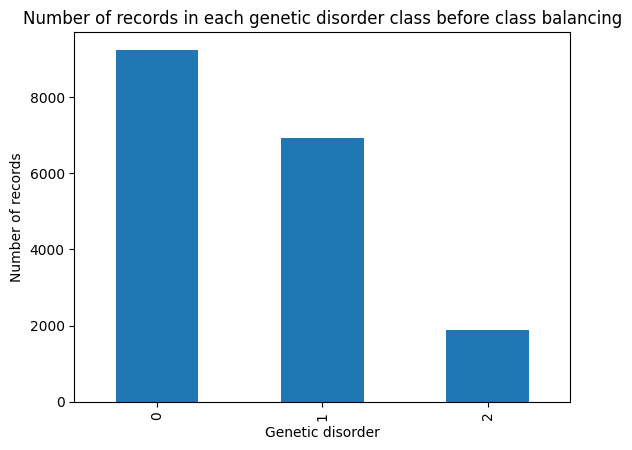

In [18]:
# Plot current class inbalance in dataset

count = y_labs.value_counts()
count.plot.bar()
plt.ylabel('Number of records')
plt.xlabel('Genetic disorder')
plt.title("Number of records in each genetic disorder class before class balancing")
plt.show()

# ref 17


In [24]:
# Undersample the majority classes
rus = RandomUnderSampler(random_state=0)

X_resampled, y_resampled = rus.fit_resample(x_feats, y_labs)

print(sorted(Counter(y_resampled).items()))

# ref 17

[(0, 1877), (1, 1877), (2, 1877)]


In [25]:
# Using a 60%, 20%, 20% split for training, validation and test sets
# don't touch test set until the end.

x, X_test, y, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, train_size=0.8, random_state = 1)
X_train, X_validate, y_train, y_validate = train_test_split(x, y, test_size = 0.25, train_size =0.75, random_state = 1)


# ref 7

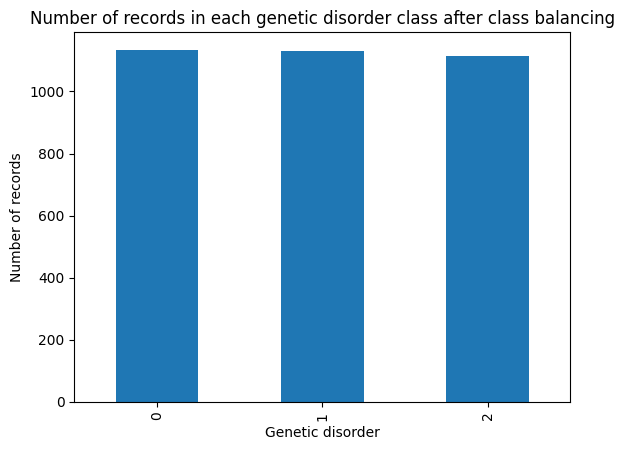

In [21]:
# Plot balanced dataset

count = y_train.value_counts()
count.plot.bar()
plt.ylabel('Number of records')
plt.xlabel('Genetic disorder')
plt.title("Number of records in each genetic disorder class after class balancing")
plt.show()

# ref 17

# Fit the models to training set

# 1) Logistic regression


Logistic regression is used to predict target variables with set classes (binary, categorical data). It can be used for targets with 2 classes or multiple classes.

Assumptions:

- Target features are categorical (represented by classes)
- Linear relationship between features
- Features are independent 
- Features not highly correlated (no multicollinearity)
- Large enough dataset to avoid overfit
- No strongly influential outliers
- No missing data

Pros:

- Can handle any number of features
- Can perform multiclass classification
- Easy to interpret
- No assumptions about class distribution
- Works well when features are well separated

Cons:

- Requires a relatively large sample size
- Can lead to overfitting in high dimensions
- Only works well with linear relationships between data
- Doesn't work particularly well if multicollinearity is present


(ref 19 & 20)



In [22]:
## chisq feature selection in sklearn
# returns the chi2 statistic and p-values for each of the features
# from this select the best (k=12) ones

feature_selection.chi2(X_train, y_train)

# Can see that features in columns 24, 25, 1, 2, 3, 4, 23, 22, 21, 0, 6, 7 have highest chi2 scores

# ref 18

(array([7.37681317e+00, 3.14765055e+01, 3.68604834e+01, 1.33862981e+01,
        2.24136870e+01, 7.21256870e-04, 4.98046550e+00, 4.77465250e+00,
        2.42902525e+00, 1.22426140e-01, 5.21715359e-01, 1.91087233e+00,
        2.21252287e+00, 1.45034827e+00, 9.33795606e-02, 2.04401387e-01,
        1.67832156e+00, 1.50094455e+00, 8.77982701e-01, 2.04773617e+00,
        5.58580288e-01, 2.55394303e+01, 5.44694631e+01, 7.78378031e+01,
        1.26651730e+02, 1.95744512e+02, 8.26068518e-02, 6.12259393e-01,
        1.77347367e+00]),
 array([2.50118246e-02, 1.46205490e-07, 9.90484590e-09, 1.23937376e-03,
        1.35809360e-05, 9.99639437e-01, 8.28906716e-02, 9.18750064e-02,
        2.96854658e-01, 9.40622800e-01, 7.70390554e-01, 3.84644340e-01,
        3.30793344e-01, 4.84240239e-01, 9.54383420e-01, 9.02848338e-01,
        4.32072975e-01, 4.72143518e-01, 6.44686356e-01, 3.59202823e-01,
        7.56320430e-01, 2.84566107e-06, 1.48629967e-12, 1.25237909e-17,
        3.14721377e-28, 3.12334001e-43

In [26]:
x_resamp_select_best = X_resampled.iloc[:, [0, 1, 2, 3, 4, 6, 7, 21, 22, 23, 24, 25]]


x_resamp_select_best.head()

,Patient_Age,Genes_Mother_Side,Inherited_From_Father,Maternal_Gene,Paternal_Gene,Mother_Age,Father_Age,Symptom_1,Symptom_2,Symptom_3,Symptom_4,Symptom_5
0,14.0,1,0.0,1.0,1,37.0,42.0,1.0,0.0,0.0,1.0,0.0
1,4.0,1,0.0,0.0,0,38.0,28.0,0.0,1.0,0.0,0.0,1.0
2,2.0,0,0.0,1.0,1,35.0,42.0,1.0,1.0,1.0,0.0,0.0
3,14.0,1,0.0,1.0,0,33.0,38.0,1.0,1.0,1.0,0.0,0.0
4,5.0,0,0.0,1.0,1,35.0,42.0,0.0,1.0,1.0,0.0,1.0


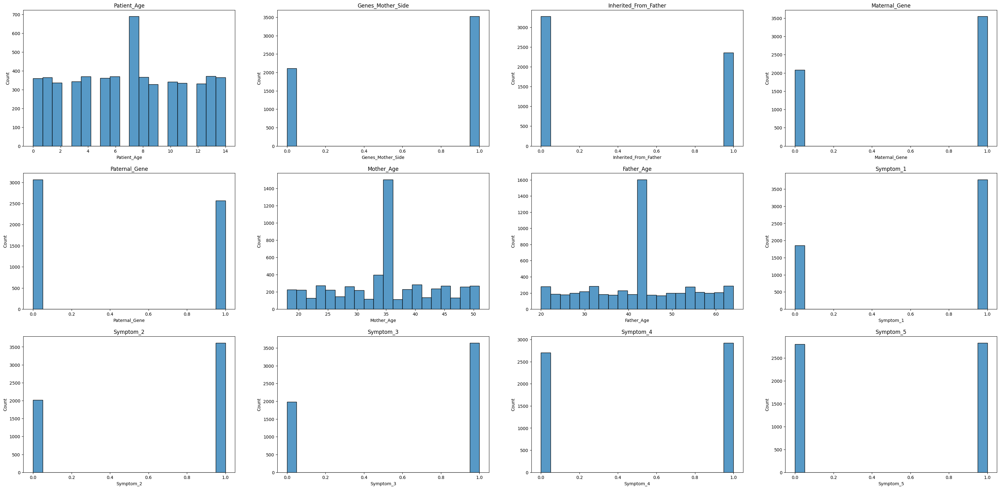

In [101]:
# Check selected features

# sns distribution plots 
dat = x_resamp_select_best
N_col = dat.columns

plt.figure(figsize=(40,80), facecolor='white')
plotnum=1
for col in N_col:
    ax=plt.subplot(12,4,plotnum)
    sns.histplot(dat[col], bins=20)
    plt.title(col)
    plotnum+=1
plt.show()


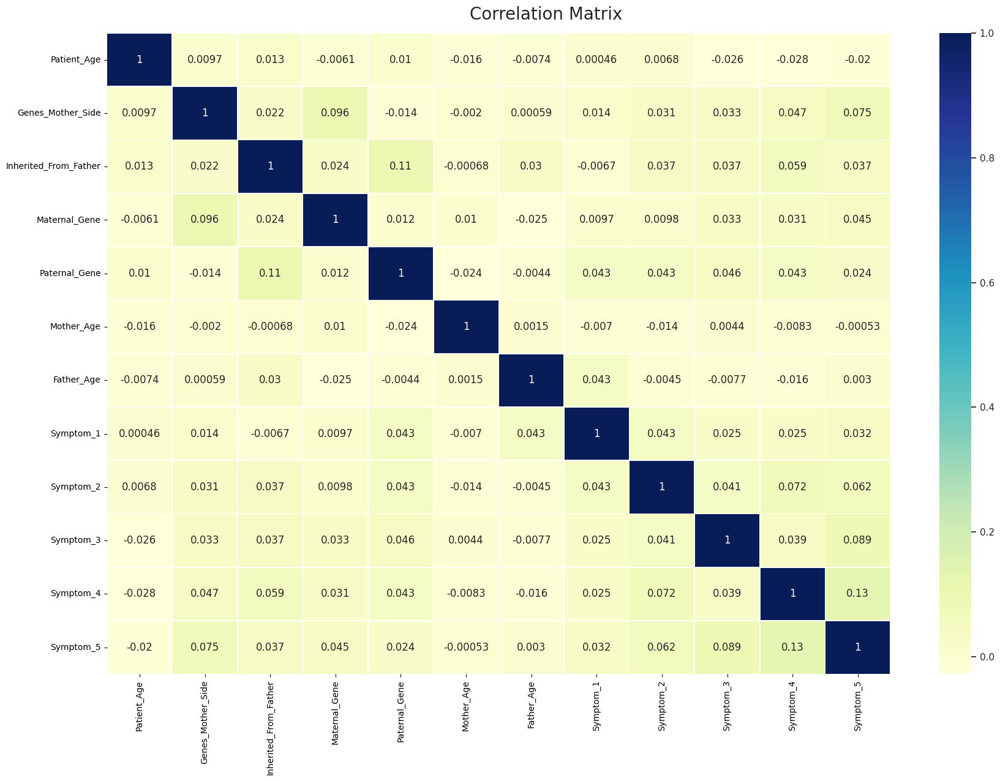

In [102]:
# correlation heatmap
#colormap = plt.cm.RdBu
colormap = "YlGnBu"

plt.subplots(figsize = (18,13))
sns.set(font_scale = 1)

hmap = sns.heatmap(data = x_resamp_select_best.corr(numeric_only = True),
            annot = True,
            linewidths = .5,
            cmap = colormap
            )

plt.suptitle("Correlation Matrix", fontsize = 20)
plt.tight_layout()


In [27]:
# create a scaler object and fit it to your data
scaler = StandardScaler()
X_scaled_best = scaler.fit_transform(x_resamp_select_best)

In [28]:
# Using a 60%, 20%, 20% split for training, validation and test sets

x, X_test, y, y_test = train_test_split(X_scaled_best, y_resampled, test_size=0.2, train_size=0.8, random_state = 1)
X_train, X_validate, y_train, y_validate = train_test_split(x, y, test_size = 0.25, train_size =0.75, random_state = 1)


# ref 7

In [28]:
# Create Model

clf = LogisticRegression(max_iter = 300)


In [29]:
# Fit Model

model = clf.fit(X_train, y_train)

In [30]:
# Score

print(f'Score on training data: {model.score(X_train, y_train)}')

Score on training data: 0.5583185316755477


In [31]:
# predict y values for test data
y_pred_class = model.predict(X_train)
print(y_pred_class)

[2 1 2 ... 2 0 0]


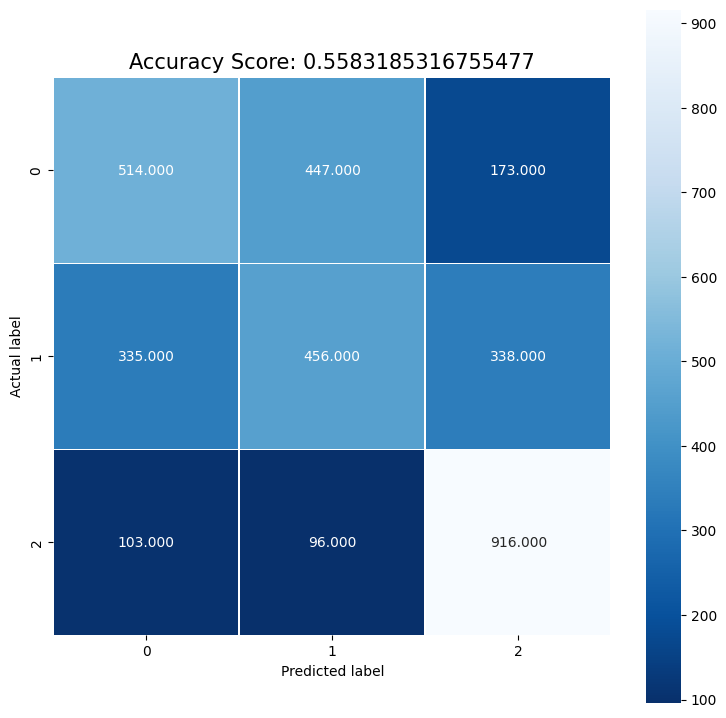

In [32]:
# confusion matrix

cm = met.confusion_matrix(y_train, y_pred_class)
score = model.score(X_train, y_train)

plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

In [33]:
# classification report
print(met.classification_report(y_train, y_pred_class))

              precision    recall  f1-score   support

           0       0.54      0.45      0.49      1134
           1       0.46      0.40      0.43      1129
           2       0.64      0.82      0.72      1115

    accuracy                           0.56      3378
   macro avg       0.55      0.56      0.55      3378
weighted avg       0.55      0.56      0.55      3378



Use validation set to tune hyperparameters

In [34]:
# Use validation set to improve model
# Tune the hyperparameters for logistic regression model using the validate set

# Define the hyperparameters to tune
params = {'penalty': ['l2'],
          'tol': [0.0001, 0.001, 0.01], 
          'C' : [0.5, 1.0, 1.5], 
          'solver': ['lbfgs', 'liblinear', 'newton-cg'],
          'max_iter': [100, 300, 500]}

# Create a logistic regression object
dt = LogisticRegression()

# Create a grid search object
grid_search = GridSearchCV(estimator = dt, param_grid = params, cv = 5)

# Fit the grid search object to the data
grid_search.fit(X_validate, y_validate)

# Print the best hyperparameters
print(grid_search.best_params_)


# ref 8 & 9

{'C': 0.5, 'max_iter': 100, 'penalty': 'l2', 'solver': 'lbfgs', 'tol': 0.0001}


Run model on test data set with tuned hyperparameters

In [35]:
# Run model on test set with tuned hyperparameters

clf_test = LogisticRegression(C = 0.5, max_iter= 100, penalty = 'l2', solver = 'lbfgs', tol = 0.0001)

model_test = clf_test.fit(X_test, y_test)

print(model_test.score(X_test, y_test))

0.5554569653948536


In [36]:
# calculate predicted labels:
# predict y values for test data
y_pred_class = model_test.predict(X_test)
print(y_pred_class)

# predicted probabilities on test set:

model_test.predict_proba(X_test)

[2 2 0 ... 0 2 2]


array([[0.24258768, 0.30697115, 0.45044117],
       [0.33075499, 0.29654445, 0.37270056],
       [0.38237242, 0.33826235, 0.27936523],
       ...,
       [0.48773948, 0.44460937, 0.06765115],
       [0.29055339, 0.28471423, 0.42473239],
       [0.24081944, 0.2266323 , 0.53254825]])

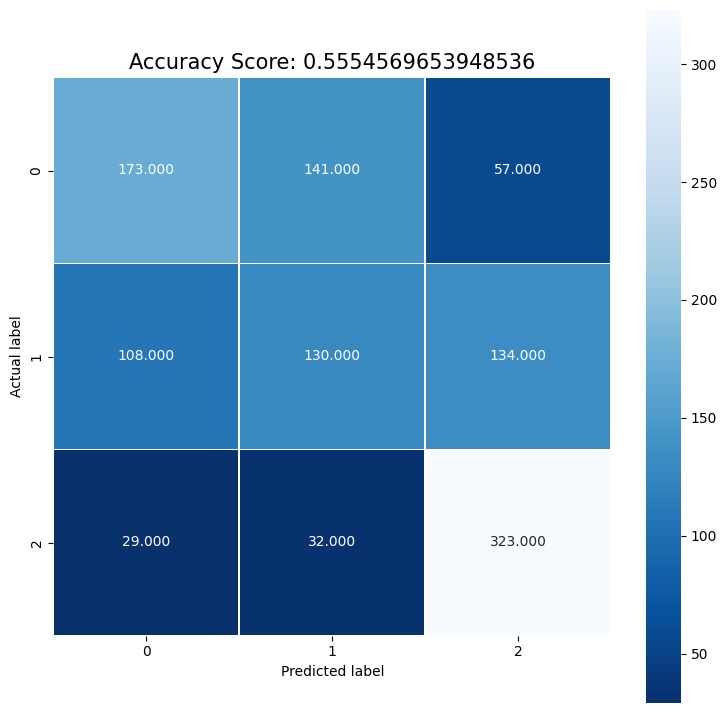

In [37]:
# confusion matrix

cm = met.confusion_matrix(y_test, y_pred_class)
score = model_test.score(X_test, y_test)

plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

In [38]:
# classification report for test data

print(met.classification_report(y_test, y_pred_class))

              precision    recall  f1-score   support

           0       0.56      0.47      0.51       371
           1       0.43      0.35      0.39       372
           2       0.63      0.84      0.72       384

    accuracy                           0.56      1127
   macro avg       0.54      0.55      0.54      1127
weighted avg       0.54      0.56      0.54      1127



In [40]:
# Predict probabilities for the test set

y_pred_proba = model_test.predict_proba(X_test)

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba, multi_class = 'ovo')

print(f"ROC auc with tuned hyperparameters: {roc_auc}")

ROC auc with tuned hyperparameters: 0.7257660905392284


In [87]:
# Get the predicted probability vector and explicitly name the columns

probs = model_test.predict_proba(X_test)

prob_dat = pd.DataFrame(probs, columns = ['Mitochondrial genetic inheritance disorders (0)', 'Single-gene inheritance diseases (1)',\
                                                   'Multifactorial genetic inheritance disorders (2)'])

prob_dat.head()


,Mitochondrial genetic inheritance disorders (0),Single-gene inheritance diseases (1),Multifactorial genetic inheritance disorders (2)
0,0.242588,0.306971,0.450441
1,0.330755,0.296544,0.372701
2,0.382372,0.338262,0.279365
3,0.457032,0.490624,0.052344
4,0.343548,0.332176,0.324276


A logistic regression model was able to predict the genetic disorder with 55.8% accuracy on the training dataset using the default hyperparameters and 55.54% accuracy on the test dataset after tuning the hyperparameters. This does not appear to be a very useful model as there appear to be a large number of misclassification of the genetic disorder classes as seen in the confusion matrix.

# 2) K-Nearest Neighbours

Definition:

A simple and easy to implement supervised machine learning model. In logistic regression it looks at the closest k data points to the data point in question. From this it takes the most common class seen in these k data points and assigns the new point to this class as well.

Assumptions:

- Data points that exist in close proximity are likely to be part of the same group
- A single value of k must be chosen
- k is odd to prevent a tie
- if k=1 then algorithm is named nearest neighbor

Pros:

- No assumptions about data
- Relatively high accuracy
- Simple, easy to explain and interpret
- Can be used for both classification and regression

Cons:

- Computationally expensive (as algorithm stores all the training data)
- Requires a lot of memory
- Can be affected by large volume of data or any irrelevant features in the dataset
- Predictions can be slow for large datasets

(ref 20 & 21)

In [75]:
# Standarize the data = scale dataset so all values have mean 0 and sd 1.

X_stand = (x_resamp_select_best - x_resamp_select_best.mean()) / x_resamp_select_best.std()

# Using a 60%, 20%, 20% split for training, validation and test sets

x, X_test, y, y_test = train_test_split(X_stand, y_resampled, test_size=0.2, train_size=0.8, random_state = 1)
X_train, X_validate, y_train, y_validate = train_test_split(x, y, test_size = 0.25, train_size =0.75, random_state = 1)


# ref 7


In [76]:
# fit KNN with default hyperparameters

model = KNeighborsClassifier()

# fit model on the data:

model.fit(X_train, y_train)

KNeighborsClassifier()

In [77]:
# predict the response values for the observations in X_train
predictions = model.predict(X_train)

predictions

array([2, 0, 0, ..., 2, 0, 0])

In [78]:
# evaluate performance of the model on training data

accuracy = accuracy_score(y_train, predictions)
precision = precision_score(y_train, predictions, average = 'macro')
recall = recall_score(y_train, predictions, average = 'macro')
f1 = f1_score(y_train, predictions,average = 'macro')

print('KNN Accuracy on training data with default hyperparameters:', accuracy)
print('KNN Precision on training data with default hyperparameters:', precision)
print('KNN Recall on training data with default hyperparameters:', recall)
print('KNN F1-score on training data with default hyperparameters:', f1)

KNN Accuracy on training data with default hyperparameters: 0.6850207223208999
KNN Precision on training data with default hyperparameters: 0.6856289996062528
KNN Recall on training data with default hyperparameters: 0.6852755463945793
KNN F1-score on training data with default hyperparameters: 0.6842185184772065


In [79]:
# default hyperparameters on validation set

model = KNeighborsClassifier()

model.fit(X_validate, y_validate)



KNeighborsClassifier()

In [80]:
# predict the response values for the observations in X_validate
predictions = model.predict(X_validate)

predictions

array([2, 2, 1, ..., 2, 0, 1])

In [81]:
# evaluate performance of the model on validation data

accuracy = accuracy_score(y_validate, predictions)
precision = precision_score(y_validate, predictions, average = 'macro')
recall = recall_score(y_validate, predictions, average = 'macro')
f1 = f1_score(y_validate, predictions,average = 'macro')

print('KNN Accuracy on validation data with default hyperparameters:', accuracy)
print('KNN Precision on validation data with default hyperparameters:', precision)
print('KNN Recall on validation data with default hyperparameters:', recall)
print('KNN F1-score on validation data with default hyperparameters:', f1)

KNN Accuracy on validation data with default hyperparameters: 0.7015985790408525
KNN Precision on validation data with default hyperparameters: 0.7009352666722201
KNN Recall on validation data with default hyperparameters: 0.7015495043692251
KNN F1-score on validation data with default hyperparameters: 0.6996083704174509


In [82]:
# Use validation set to improve model
# Tune the hyperparameters for KNN model using the validation set

# Define the hyperparameters to tune
params = {'n_neighbors': [5, 9, 15],
          'weights': ['uniform', 'distance'],
            'algorithm': ['auto', 'ball_tree', 'kd_tree']
          }

# Create a logistic regression object
dt = KNeighborsClassifier()

# Create a grid search object
grid_search = GridSearchCV(estimator = dt, param_grid = params, cv = 5)

# Fit the grid search object to the data
grid_search.fit(X_validate, y_validate)

# Print the best hyperparameters
print(grid_search.best_params_)


# ref 8 & 11

{'algorithm': 'auto', 'n_neighbors': 9, 'weights': 'distance'}


In [92]:
# optimised hyperparameters on training set

model = KNeighborsClassifier(n_neighbors = 9, weights = 'distance', algorithm = 'auto')

model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=9, weights='distance')

In [93]:
# predict the response values for the observations in X_validate
y_pred = model.predict(X_train)

y_pred

array([2, 0, 0, ..., 2, 0, 0])

In [94]:
# evaluate performance of the model on test data

accuracy = accuracy_score(y_train, y_pred)
precision = precision_score(y_train, y_pred, average = 'macro')
recall = recall_score(y_train, y_pred, average = 'macro')
f1 = f1_score(y_train, y_pred,average = 'macro')

print('KNN Accuracy on training data with tuned hyperparameters:', accuracy)
print('KNN Precision on training data with tuned hyperparameters:', precision)
print('KNN Recall on training data with tuned hyperparameters:', recall)
print('KNN F1-score on training data with tuned hyperparameters:', f1)

KNN Accuracy on training data with tuned hyperparameters: 0.9985198342214328
KNN Precision on training data with tuned hyperparameters: 0.9985289722419397
KNN Recall on training data with tuned hyperparameters: 0.9985089388204172
KNN F1-score on training data with tuned hyperparameters: 0.998517362011227


In [95]:
# optimised hyperparameters on validation set

model = KNeighborsClassifier(n_neighbors = 9, weights = 'distance', algorithm = 'auto')

model.fit(X_validate, y_validate)


KNeighborsClassifier(n_neighbors=9, weights='distance')

In [96]:
# predict the response values for the observations in X_validate
y_pred = model.predict(X_validate)

y_pred

array([2, 2, 0, ..., 2, 0, 1])

In [97]:
# evaluate performance of the model on test data

accuracy = accuracy_score(y_validate, y_pred)
precision = precision_score(y_validate, y_pred, average = 'macro')
recall = recall_score(y_validate, y_pred, average = 'macro')
f1 = f1_score(y_validate, y_pred, average = 'macro')

print('KNN Accuracy on validation data with tuned hyperparameters:', accuracy)
print('KNN Precision on validation data with tuned hyperparameters:', precision)
print('KNN Recall on validation data with tuned hyperparameters:', recall)
print('KNN F1-score on validation data with tuned hyperparameters:', f1)

KNN Accuracy on validation data with tuned hyperparameters: 0.9982238010657194
KNN Precision on validation data with tuned hyperparameters: 0.9982174688057041
KNN Recall on validation data with tuned hyperparameters: 0.9982316409621373
KNN F1-score on validation data with tuned hyperparameters: 0.998220991206173


In [101]:
# Run model on test data

model = KNeighborsClassifier()

model.fit(X_test, y_test)

KNeighborsClassifier()

In [102]:
# predict the response values for the observations in X_test
y_predictions = model.predict(X_test)

y_predictions

array([2, 2, 0, ..., 1, 1, 2])

In [225]:
# evaluate performance of the model on test data - using default hyperparameters as tuned ones are overfitting.

accuracy = accuracy_score(y_test, y_predictions)
precision = precision_score(y_test, y_predictions, average = 'macro')
recall = recall_score(y_test, y_predictions, average = 'macro')
f1 = f1_score(y_test, y_predictions,average = 'macro')

print('KNN Accuracy on test data with default hyperparameters:', accuracy)
print('KNN Precision on test data with default hyperparameters:', precision)
print('KNN Recall on test data with default hyperparameters:', recall)
print('KNN F1-score on test data with default hyperparameters:', f1)

KNN Accuracy n test data with default hyperparameters: 0.6672582076308784
KNN Precision on test data with default hyperparameters: 0.6634707394199775
KNN Recall on test data with default hyperparameters: 0.6661977309944063
KNN F1-score on test data with default hyperparameters: 0.6636941869623167


K-Nearest Neighbour conclusions

- The default hyperparameters appear to achieve higher accuracy than seen in other models, with 66.7% accuracy seen on the test data. However, when the hyperparameters were optimised, the accuracy, precision, recall and f1 score of the test data were all 1. This suggests that over fitting or data leakage has occured or that the test sample size is too small.

- Using the top 12 selected features but from the whole dataset (not balanced) was also tried. However, this lead to very low accuracy (<0.5).

From this it appears that using the default hyperparameters on the 12 best features with a balanced dataset yielded the best result for this model.

# 3) Support Vector Machines (SVM)

Definition: SVM is a linear algebraic method to separate n-dimensional data into classes. The data is separated by a hyperplane (boundary with dimensionality of n-1). The decision boundary is used to find the best possible line that separates the points as accurately as possible into classes. The maximum separation of classes is the first priority.

Assumptions

- Data is independent with indentical distribution

Pros

- Robust to outliers
- Good for data with high dimensionality
- Works when the number of features is larger than the number of samples

Cons

- Quite easy to overfit
- Full labelling of input data required
- Doesn't natively handle more than 2 classes (must use one vs rest or one vs one)
- Solution parameters are hard to interpret
- Slow to train model (not ideal for larger datasets)

(ref 20)

In [29]:
# Scale data between 0 and 1 for use with SVM model
# reduces affect of outliers on the model
# Using a 60%, 20%, 20% split for training, validation and test sets

x, X_test, y, y_test = train_test_split(X_scaled_best, y_resampled, test_size=0.2, train_size=0.8, random_state = 1)
X_train, X_validate, y_train, y_validate = train_test_split(x, y, test_size = 0.25, train_size =0.75, random_state = 1)


# ref 7


In [30]:
# fit the model with default hyperparameters

clf_SVM = svm.SVC()
clf_SVM.fit(X_train, y_train)

# ref 10

SVC()

In [31]:
# get predictions on training data
y_pred_svm = clf_SVM.predict(X_train)

# Accuracy score
print(f'Accuracy score for SVM model using default hyperparameters: {accuracy_score(y_train, y_pred_svm)}')

Accuracy score for SVM model using default hyperparameters: 0.6711071640023683


In [32]:
# run model with default hyperparameters on validation set

clf_SVM.fit(X_validate, y_validate)

y_pred_svm = clf_SVM.predict(X_validate)

# Accuracy score
print(f'Accuracy score for validation data for SVM model using default hyperparameters: {accuracy_score(y_validate, y_pred_svm)}')

Accuracy score for validation data for SVM model using default hyperparameters: 0.7335701598579041


In [33]:
# get support vectors
print(clf_SVM.support_vectors_)

# get indices of support vectors
print(clf_SVM.support_)

# get number of support vectors for each class
print(clf_SVM.n_support_)

# ref 10

[[ 1.67123816 -1.29227929  1.17729221 ...  0.73785653 -1.03967844
  -1.00587769]
 [-0.70848698  0.77382653 -0.84940679 ...  0.73785653 -1.03967844
  -1.00587769]
 [ 0.48137559 -1.29227929  1.17729221 ...  0.73785653  0.96183585
   0.99415666]
 ...
 [ 0.00543056  0.77382653  1.17729221 ...  0.73785653  0.96183585
   0.99415666]
 [-0.23254196 -1.29227929 -0.84940679 ...  0.73785653 -1.03967844
   0.99415666]
 [ 0.48137559  0.77382653 -0.84940679 ... -1.35527703  0.96183585
   0.99415666]]
[   2    4    7   13   19   20   24   27   38   43   46   53   54   62
   66   68   71   77   78   81   86   88   91   92  100  107  111  122
  126  132  133  135  142  145  146  158  161  162  163  164  166  167
  169  176  184  192  193  196  208  211  212  213  215  220  223  233
  236  237  239  242  243  244  249  253  255  261  262  263  264  269
  271  273  274  275  276  277  278  281  283  284  285  286  291  299
  303  305  309  310  318  319  321  324  327  330  332  333  335  338
  348  349 

Tune hyperparameters for SVM model using validation set

In [31]:
# Use validation set to improve model
# Tune the hyperparameters for SVM model using the validation set

# Define the hyperparameters to tune
params = {'C': [0.5, 1, 50],
          'kernel': ['linear', 'poly', 'rbf'],
            'tol': [0.001, 0.01]
          }

# Create a logistic regression object
dt = svm.SVC()

# Create a grid search object
grid_search = GridSearchCV(estimator = dt, param_grid = params, cv = 5)

# Fit the grid search object to the data
grid_search.fit(X_validate, y_validate)

# Print the best hyperparameters
print(grid_search.best_params_)


# ref 8 & 12

# default parameters are the best.

{'C': 1, 'kernel': 'rbf', 'tol': 0.001}


In [34]:
# run model on test dataset

clf_SVM = svm.SVC()
clf_SVM.fit(X_test, y_test)

SVC()

In [35]:
# get predictions on training data
y_test_svm = clf_SVM.predict(X_test)

# Accuracy score
print(f'Accuracy score for TEST data with SVM model using default hyperparameters: {accuracy_score(y_test, y_test_svm)}')

Accuracy score for TEST data with SVM model using default hyperparameters: 0.7054125998225377


In [41]:
X_scaled_best

array([[ 1.67123816,  0.77382653, -0.84940679, ..., -1.35527703,
         0.96183585, -1.00587769],
       [-0.70848698,  0.77382653, -0.84940679, ..., -1.35527703,
        -1.03967844,  0.99415666],
       [-1.18443201, -1.29227929, -0.84940679, ...,  0.73785653,
        -1.03967844, -1.00587769],
       ...,
       [-0.70848698,  0.77382653, -0.84940679, ...,  0.73785653,
         0.96183585,  0.99415666],
       [ 0.24340307, -1.29227929,  1.17729221, ...,  0.73785653,
         0.96183585, -1.00587769],
       [ 0.95732061,  0.77382653, -0.84940679, ...,  0.73785653,
         0.96183585,  0.99415666]])

Conclusions for SVM model

- The default hyperparameters appear to be the best for the SVM model. Accuracy score of 0.705 was achieved on the test dataset.

# 4) Stacking model

Definition:

An ensemble method that combines multiple different regresssion or classification (base) models into one meta model. The output of the base models serves as the features for the meta model. Higher accuracy can be achieved by stacking than from individual models.

The algorithm to train a stacked model follows these steps:

1) Split the data into k-folds.
2) Select one fold for validation and the remaining k-1 folds for training.
3) Train the base models on the training set and generate predictions on the validation set.
4) Repeat 2nd and 3rd steps for the remaining k-1 folds. Create an augmented dataset with the predictions of each base model included as additional features.
5) Train the final meta model on the augmented dataset.
(from ref 22)


Pros:

- Stacking can increase accuracy from weak base models
- It reduces variances and can lead to a more robust model

Cons:

- Training can take longer
- Can be computationally expensive

(ref 22)

In [206]:
# Using same scaling and feature selection from logistic regression model
# Using a 60%, 20%, 20% split for training, validation and test sets

x, X_test, y, y_test = train_test_split(X_scaled_best, y_resampled, test_size=0.2, train_size=0.8, random_state = 1)
X_train, X_validate, y_train, y_validate = train_test_split(x, y, test_size = 0.25, train_size =0.75, random_state = 1)


# ref 7

In [207]:
np.random.seed(0)

# define base models
clf1 = KNeighborsClassifier(n_neighbors = 1)
clf2 = RandomForestClassifier(n_estimators = 10, random_state = 1)
clf3 = GaussianNB()

# define meta model
lr = LogisticRegression(multi_class = 'auto', solver = 'lbfgs', max_iter = 2000)

# define stacking classifier

sclf = StackingClassifier(estimators = [('knn', clf1), ('rf', clf2), ('gnb', clf3)],
    final_estimator = lr)

/home/frances/Documents/Data_Science_Bootcamp/venv/lib/python3.10/site-packages/mlxtend/plotting/learning_curves.py:114: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  model = clf.fit(X_train[:r], y_train[:r])
/home/frances/Documents/Data_Science_Bootcamp/venv/lib/python3.10/site-packages/mlxtend/plotting/learning_curves.py:119: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  train_misclf = scoring_func[scoring](y_train[:r], y_train_predict)
/home/frances/Documents/Data_Science_Boot

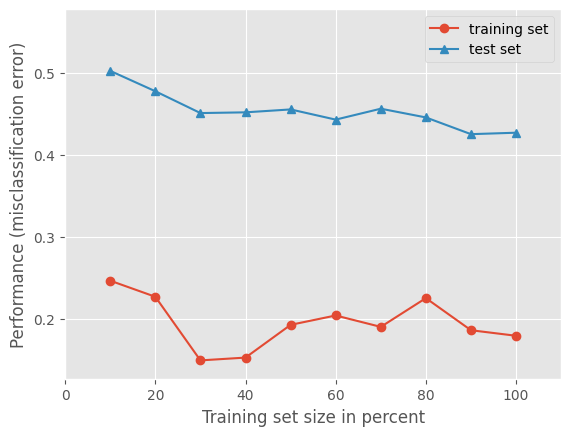

In [208]:
# plot learning curves
 
plt.figure()
plot_learning_curves(X_train, y_train, X_test, y_test, sclf, print_model=False, style='ggplot')
plt.show()

# The classification error drops a bit with a training dataset of 30-40%

In [209]:
print(X_train.shape, X_validate.shape, X_test.shape)

(3378, 12) (1126, 12) (1127, 12)


In [210]:
# Define and fit the stacking models

# modelling
# define base models
np.random.seed(0)
clf1 = KNeighborsClassifier(n_neighbors = 1)
clf2 = RandomForestClassifier(n_estimators = 10, random_state = 1)
clf3 = GaussianNB()

# define meta model
lr = LogisticRegression(multi_class = 'auto', solver = 'lbfgs', max_iter = 100)


In [211]:
# fitting the base models
label = ['K-NN', 'Random Forest', 'Naïve Bayes', 'Stacking Classifier']
clf_list = [clf1, clf2, clf3, sclf]
    
clf_cv_mean = []
clf_cv_std = []
for clf, label in zip(clf_list, label):
    
    clf.fit(X_train, y_train)    
    scores = cross_val_score(clf, X_train, y_train, cv = 3, scoring = 'accuracy')
    print('Accuracy: %.2f (+/- %.2f) [%s]' % (scores.mean(), scores.std(), label))
    clf_cv_mean.append(scores.mean())
    clf_cv_std.append(scores.std())


Accuracy: 0.49 (+/- 0.01) [K-NN]
Accuracy: 0.52 (+/- 0.01) [Random Forest]
Accuracy: 0.54 (+/- 0.01) [Naïve Bayes]
Accuracy: 0.56 (+/- 0.01) [Stacking Classifier]


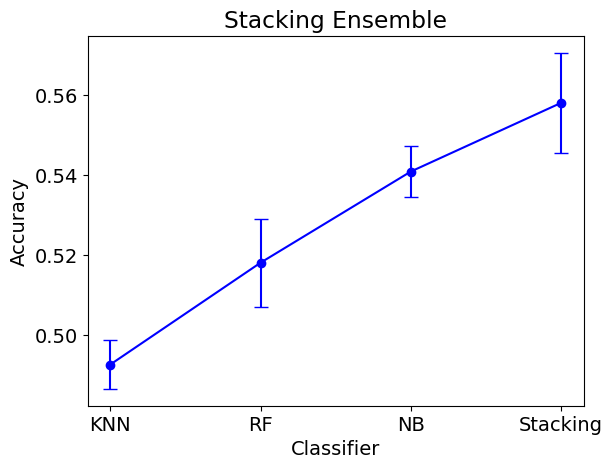

In [212]:
# plot classifier accuracy - of base models  
plt.figure()
(_, caps, _) = plt.errorbar(
    range(4),
    clf_cv_mean,
    yerr = clf_cv_std,
    c = 'blue',
    fmt = '-o',
    capsize = 5)

for cap in caps:
    cap.set_markeredgewidth(1)                                                                                                                                

plt.title('Stacking Ensemble')
plt.ylabel('Accuracy')
plt.xlabel('Classifier')
plt.xticks(range(4), ['KNN', 'RF', 'NB', 'Stacking'])     
plt.show()

In [213]:
# Verify and evaluate training model

# define stacking classifier
# meta classifier = lr (defined above)

stacking_clf = StackingClassifier(estimators = [('knn', clf1), ('rf', clf2), ('gnb', clf3)],
    final_estimator = lr)

In [214]:
# fit meta model

clf = stacking_clf.fit(X_train, y_train)

In [215]:
# train stacking classifier using cross-validation

y_pred = cross_val_predict(clf, X_train, y_train)

In [216]:
# evaluate performance of the meta model
# used macro averaging technique for multiclass classification
# a simple mean of all metrics across classes - good for balanced classification problems.

accuracy = accuracy_score(y_train, y_pred)
precision = precision_score(y_train, y_pred, average = 'macro')
recall = recall_score(y_train, y_pred, average = 'macro')
f1 = f1_score(y_train, y_pred, average = 'macro')

print('Accuracy:', accuracy)
print('Precision:', precision)
print('Recall:', recall)
print('F1-score:', f1)

# ref 13

Accuracy: 0.5636471284783896
Precision: 0.5524189348683705
Recall: 0.5644860431000439
F1-score: 0.5555939318786316


In [217]:
# Predict probabilities for the training set
# using multi class as one vs one (ovo). Can also use one vs rest (ovr)

y_pred_proba = clf.predict_proba(X_train)

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_train, y_pred_proba, multi_class = 'ovo')

print(f"ROC auc: {roc_auc}")

ROC auc: 0.9059897807493579


Tune hyperparameters of stacking models

In [50]:
# Tune the hyperparameters for KNN model using the validate set - base model

params = {'n_neighbors': [3, 5, 7, 9, 11],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
          'p' : [1, 2],
          'weights' : ['uniform', 'distance']}

# Create a decision tree classifier object
dt = KNeighborsClassifier()

# Create a grid search object
grid_search_KNN = GridSearchCV(estimator = dt, param_grid = params, cv = 5)

# Fit the grid search object to the data
grid_search_KNN.fit(X_validate, y_validate)

# Print the best hyperparameters
print(grid_search_KNN.best_params_)

# min_samples_leaf: Minimum number of data points in a leaf node
# max_depth: Max depth of the tree


{'algorithm': 'auto', 'n_neighbors': 11, 'p': 1, 'weights': 'distance'}


In [51]:
# Tune the hyperparameters for random forest model using the validate set - base model

params = {'n_estimators': [10, 50, 100, 200, 500],
          'criterion': ['gini', 'entropy', 'log_loss'],
          'max_depth': ['None', 2, 4, 6, 8],
          'min_samples_split': [1, 2, 4, 6]
          }


# Create a classifier object
dt = RandomForestClassifier()

# Create a grid search object
grid_search = GridSearchCV(estimator = dt, param_grid = params, cv = 5)

# Fit the grid search object to the data
grid_search.fit(X_validate, y_validate)

# Print the best hyperparameters
print(grid_search.best_params_)





/home/frances/Documents/Data_Science_Bootcamp/venv/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
600 fits failed out of a total of 1500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
300 fits failed with the following error:
Traceback (most recent call last):
  File "/home/frances/Documents/Data_Science_Bootcamp/venv/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/frances/Documents/Data_Science_Bootcamp/venv/lib/python3.10/site-packages/sklearn/ensemble/_forest.py", line 476, in fit
    trees = Parallel(
  File "/home/frances/Documents/Data_Science_Bootcamp/venv/lib/python3.10/s

{'criterion': 'gini', 'max_depth': 8, 'min_samples_split': 6, 'n_estimators': 500}


In [52]:
# Tune the hyperparameters for Gaussian NB model using the validate set - base model


params = {'var_smoothing': np.logspace(0,-9, num=100)}


# Create a classifier object
dt = GaussianNB()

# Create a grid search object
grid_search_NB = GridSearchCV(estimator = dt, param_grid = params, cv = 5)

# Fit the grid search object to the data
grid_search_NB.fit(X_validate, y_validate)

# Print the best hyperparameters
print(grid_search_NB.best_params_)


# 14


{'var_smoothing': 0.657933224657568}


In [53]:
# META MODEL = Tune the hyperparameters for logistic regression model using the validate set

params = {'solver': ['lbfgs', 'liblinear'],
          'penalty': ['l2'],
          'max_iter': [100, 200, 300]
          }


# Create a classifier object
dt = LogisticRegression()

# Create a grid search object
grid_search = GridSearchCV(estimator = dt, param_grid = params, cv = 5)

# Fit the grid search object to the data
grid_search.fit(X_validate, y_validate)

# Print the best hyperparameters
print(grid_search.best_params_)

# optimal is the same as original parameters


{'max_iter': 100, 'penalty': 'l2', 'solver': 'lbfgs'}


In [218]:
# update hyperparameters of models and re-run stacking

# define base models
np.random.seed(0)
clf1 = KNeighborsClassifier(algorithm = 'auto', n_neighbors = 11, p = 1, weights = 'distance')
clf2 = RandomForestClassifier(criterion = 'gini', max_depth = 8, min_samples_split = 6, n_estimators = 500)
clf3 = GaussianNB(var_smoothing = 0.657933224657568)

# define meta model
lr = LogisticRegression(max_iter = 100, penalty = 'l2', solver = 'lbfgs')

In [219]:
# define stacking classifier
# meta classifier = lr (defined above)

stacking_clf = StackingClassifier(estimators = [('knn', clf1), ('rf', clf2), ('gnb', clf3)],
    final_estimator = lr)

In [220]:
# fit meta model

clf_hyp = stacking_clf.fit(X_validate, y_validate)

In [221]:
# train stacking classifier using cross-validation

y_pred_hyp = cross_val_predict(clf_hyp, X_validate, y_validate)

In [222]:
# evaluate performance of the meta model

accuracy = accuracy_score(y_validate, y_pred_hyp)
precision = precision_score(y_validate, y_pred_hyp, average = 'macro')
recall = recall_score(y_validate, y_pred_hyp, average = 'macro')
f1 = f1_score(y_validate, y_pred_hyp, average = 'macro')

print('Accuracy with tuned hyperparameters:', accuracy)
print('Precision with tuned hyperparameters:', precision)
print('Recall with tuned hyperparameters:', recall)
print('F1-score with tuned hyperparameters:', f1)

Accuracy with tuned hyperparameters: 0.5719360568383659
Precision with tuned hyperparameters: 0.5603166417577142
Recall with tuned hyperparameters: 0.5714877336073858
F1-score with tuned hyperparameters: 0.561703736017571


In [223]:
# Predict probabilities for the validation set

y_pred_proba = clf_hyp.predict_proba(X_validate)

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_validate, y_pred_proba, multi_class = 'ovo')

print(f"ROC auc with tuned hyperparameters: {roc_auc}")

ROC auc with tuned hyperparameters: 0.9802931942411847


Make predictions and evaluate test model

In [60]:
# Evaluate model against test set

# Use the classifier to make predictions on the testing data

y_pred = clf_hyp.predict(X_test)

# Evaluate the performance of the classifier

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.5971606033717834


In [63]:
# Predict probabilities for the test set

y_pred_proba = clf_hyp.predict_proba(X_test)

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba, multi_class = 'ovo')

roc_auc

0.7563635299074235

In [ ]:
# ref 15 & 16

Stacking model conclusions

- The stacking model achieved an accuracy of 0.597 on the test data and the area under the ROC curve was 0.756. The model performed similarly to the models above.

# 5) Neural networks

Definition:

- Computer systems enspired by neurons seen in the human brain. They comprise of a collection of connected units known as artificial neurons. Utilised forward and back propogation to feed information through the system and improve the model's learning.

Pros:

- Can be useful to solve complex problems (those that were challenging to express with previous algorithms)

Cons:

- Can't see what is going on inside the input layers

Figure below shows a Neural network and deep neural network structure: (ref 23)

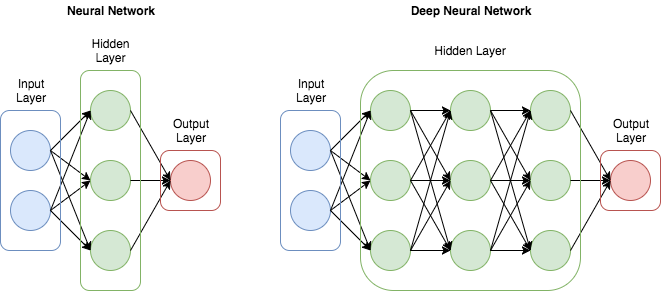

In [192]:
# Using a 60%, 20%, 20% split for training, validation and test sets

x, X_test, y, y_test = train_test_split(X_scaled_best, y_resampled, test_size=0.2, train_size=0.8, random_state = 1)
X_train, X_validate, y_train, y_validate = train_test_split(x, y, test_size = 0.25, train_size =0.75, random_state = 1)


# ref 7

In [193]:
# Set up the model architecture for a neural network
model = Sequential()

# Save number of columns as n_cols
n_cols = X_train.shape[1]

# Add the first hidden layer
model.add(Dense(15, activation='relu', input_shape=(n_cols, )))
# Add the second hidden layer
model.add(Dense(10, activation='relu'))
# Add the third hidden layer
model.add(Dense(5, activation='relu'))
# Add the output layer - output layer must have same number of nodes as number of classes with categorical output feature
model.add(Dense(3, activation='softmax'))

In [194]:
print(model.summary())

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_33 (Dense)            (None, 15)                195       
                                                                 
 dense_34 (Dense)            (None, 10)                160       
                                                                 
 dense_35 (Dense)            (None, 5)                 55        
                                                                 
 dense_36 (Dense)            (None, 3)                 18        
                                                                 
Total params: 428
Trainable params: 428
Non-trainable params: 0
_________________________________________________________________
None


In [195]:
# Compile the model for classification
model.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy', # categorical cross-entropy loss
    metrics = ['accuracy'])

In [196]:
# one-hot encoding target variable to try and resolve shape mismatch error
# Convert labels to one-hot encoded vectors
y_train = to_categorical(y_train, num_classes=3)
y_validate = to_categorical(y_validate, num_classes=3)
y_test = to_categorical(y_test, num_classes=3)



In [197]:
%%time
# Fit the model
history = model.fit(
    X_train,
    y_train,
    validation_data=(X_validate, y_validate),
    batch_size=10,
    epochs=30,
    verbose=1
)



Epoch 1/30
338/338 [==============================] - 4s 6ms/step - loss: 1.1069 - accuracy: 0.3733 - val_loss: 1.0740 - val_accuracy: 0.4440
Epoch 2/30
338/338 [==============================] - 1s 4ms/step - loss: 1.0528 - accuracy: 0.4731 - val_loss: 1.0343 - val_accuracy: 0.4920
Epoch 3/30
338/338 [==============================] - 1s 4ms/step - loss: 0.9660 - accuracy: 0.5343 - val_loss: 0.9315 - val_accuracy: 0.5604
Epoch 4/30
338/338 [==============================] - 1s 4ms/step - loss: 0.9115 - accuracy: 0.5660 - val_loss: 0.9131 - val_accuracy: 0.5755
Epoch 5/30
338/338 [==============================] - 2s 5ms/step - loss: 0.8965 - accuracy: 0.5767 - val_loss: 0.9040 - val_accuracy: 0.5959
Epoch 6/30
338/338 [==============================] - 2s 5ms/step - loss: 0.8802 - accuracy: 0.5930 - val_loss: 0.8944 - val_accuracy: 0.5933
Epoch 7/30
338/338 [==============================] - 1s 4ms/step - loss: 0.8683 - accuracy: 0.6101 - val_loss: 0.8889 - val_accuracy: 0.6030
Epoch 

In [198]:
# Evaluate the model on the test set

test_loss, test_acc = model.evaluate(X_test, y_test)
print(f'Test loss: {test_loss}, Test accuracy: {test_acc}')

36/36 [==============================] - 0s 4ms/step - loss: 0.8837 - accuracy: 0.5998
Test loss: 0.8837107419967651, Test accuracy: 0.5998225212097168


In [199]:
# Make predictions on the test set

predictions = model.predict(X_test)

36/36 [==============================] - 0s 5ms/step


In [200]:
predictions

array([[0.11474179, 0.2817361 , 0.6035222 ],
       [0.26288784, 0.47265258, 0.2644596 ],
       [0.27280223, 0.3303469 , 0.39685076],
       ...,
       [0.6822797 , 0.3149241 , 0.00279621],
       [0.21748407, 0.29939723, 0.4831188 ],
       [0.10873194, 0.20340317, 0.68786484]], dtype=float32)

In [201]:
# Find RMSE
score[0] ** (1/2)

0.9677423035264597

In [202]:
# Visualise cost of the model

history.history

{'loss': [1.106924057006836,
  1.0527743101119995,
  0.9660457968711853,
  0.9115455746650696,
  0.8965152502059937,
  0.8801872730255127,
  0.8682863712310791,
  0.859745979309082,
  0.8540021181106567,
  0.8499271869659424,
  0.8478027582168579,
  0.8433766961097717,
  0.8406040668487549,
  0.8386346697807312,
  0.8346019387245178,
  0.8320714235305786,
  0.8293558955192566,
  0.8282741904258728,
  0.8264561891555786,
  0.824422299861908,
  0.8226009011268616,
  0.8225235939025879,
  0.8199552297592163,
  0.8175590634346008,
  0.8175252676010132,
  0.8166285157203674,
  0.8137838244438171,
  0.8133792281150818,
  0.8111375570297241,
  0.8104674220085144],
 'accuracy': [0.3732978105545044,
  0.4730609953403473,
  0.5343398451805115,
  0.5660154223442078,
  0.5766726136207581,
  0.5929543972015381,
  0.6101243495941162,
  0.6083481311798096,
  0.6116045117378235,
  0.6116045117378235,
  0.6098282933235168,
  0.6133806705474854,
  0.6121965646743774,
  0.6119005084037781,
  0.6184132695

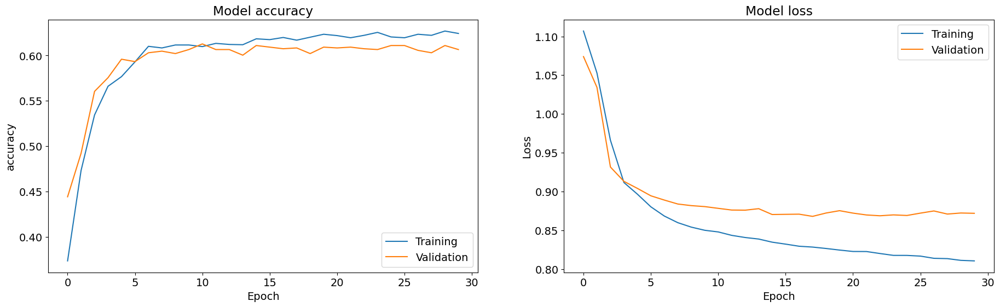

In [203]:
fig, ax = plt.subplots(1, 2, figsize = (18, 6))
fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

plt.rcParams.update({'font.size': 14})

# Plot training & validation accuracy values
ax[0].plot(history.history['accuracy'], label = 'Training')
ax[0].plot(history.history['val_accuracy'], label = 'Validation')
ax[0].set_title('Model accuracy')
ax[0].set_ylabel('accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend()

# Plot training & validation loss values
ax[1].plot(history.history['loss'], label = 'Training')
ax[1].plot(history.history['val_loss'], label = 'Validation')
ax[1].set_title('Model loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend()

plt.show()

# ref lab 9.1

Neural network conclusions

- The model accruacy achieved by this neural network was 0.598. The model accuracy did not improve much after approx. about 30 epochs and the validation loss started to increase. Therefore, the number of epochs was reduced from 100 to 30. This led to somewhat improved accuracy of the network and better learning curves.


# Results summary

Logistic regression: accuracy = 0.555, ROC = 0.726

KNN: accuracy = 0.667

SVM: accuracy = 0.705

Stacking: accuracy = 0.597, ROC = 0.756

Neural network: accuracy = 0.600

The accuracy achieved by all of the models appears to be better than random guessing. However, none of the models achieved high accuracy in predicting the genetic condition of the patient. The Support Vector Machine model appears to be the most promising model at this stage.

# Overall Conclusions

Predicting the heritability (how much is passed down from parents) of disease is a complex problem. A genetic disorder can be inherited from either or both parents, from a change in a single gene or as the result of changes in multiple genes. There is also always the impact of environmental factors on the disorder to consider as well. A person's environment (folic acid taken during pregnancy, socio-economic factors etc) can contribute to how (or if) their genetic disorder presents itself. Therefore, as there are so many contributing factors, the individual correlations seen between each feature is low. This could lead to challenges in developing an accurate machine learning model.

Generally, the most useful information in predicting heritability of a disease would come from studying whole genome sequence data of the individual and comparing this sequence with a database of other genome sequences (and known disease markers) to look for any disease markers that match to the exisitng database. However, this is very complex and this dataset does not go into this area.

A highly accuracte model would be able to assist Doctors and other medical personnel in the diagnosis and treatment of patients. However, these models would need to be more accurate to be used in a medical setting. Below are some suggestions for next steps.

# Next Steps

- Try SMOTE to impute minority classes up rather than reducing majority classes.
- Look at existing SVM kaggle notebook and compare to see why results are somewhat different.
- Try modelling without the symptoms features - as information provided on these is limited.
- Investigate whether further features could be added to the model to improve predictions:
    - Inclusion of genome sequence data would provide the most useful information but would be complex.
    - A greater range of symptoms?
    - Symptoms with more information on what they are?
    - Can we further account for environmental contributing factors?
- Try further models.
- Predicting the genetic subclass as well.

 Dataset
 
 - https://www.kaggle.com/datasets/aryarishabh/of-genomes-and-genetics-hackerearth-ml-challenge?select=train.csv

References

1) https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots_adjust.html
2) https://stackoverflow.com/questions/49199164/increasing-pie-chart-size-with-matplotlib-radius-parameter-appears-to-do-nothin
3) https://matplotlib.org/3.1.1/api/text_api.html
4) https://www.kaggle.com/code/brsdincer/genomes-and-genetics-disorder-eda-process-i
5) https://towardsdatascience.com/how-to-drop-rows-in-pandas-dataframes-with-nan-values-in-certain-columns-7613ad1a7f25
6) https://www.analyticsvidhya.com/blog/2021/04/beginners-guide-to-missing-value-ratio-and-its-implementation/
7) https://datascience.stackexchange.com/questions/15135/train-test-validation-set-splitting-in-sklearn
8) https://towardsdatascience.com/hyperparameter-tuning-with-grid-search-and-random-search-6e1b5e175144
9) https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
10) https://scikit-learn.org/stable/modules/svm.html
11) https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
12) https://scikit-learn.org/stable/modules/svm.html
13) https://towardsdatascience.com/comprehensive-guide-on-multiclass-classification-metrics-af94cfb83fbd
14) https://stackoverflow.com/questions/39828535/how-to-tune-gaussiannb
15) https://towardsdatascience.com/simple-model-stacking-explained-and-automated-1b54e4357916
16) https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.StackingClassifier.html
17) https://imbalanced-learn.org/stable/under_sampling.html
18) https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.chi2.html
19) https://towardsdatascience.com/assumptions-of-logistic-regression-clearly-explained-44d85a22b290
20) https://www.kdnuggets.com/2021/02/machine-learning-assumptions.html
21) https://towardsdatascience.com/machine-learning-basics-with-the-k-nearest-neighbors-algorithm-6a6e71d01761
22) https://towardsdatascience.com/a-practical-guide-to-stacking-using-scikit-learn-91e8d021863d
23) https://www.reddit.com/r/learnmachinelearning/comments/9m561w/how_do_i_accurately_understand_a_neural_network/


Domain knowledge:

a) https://www.ncbi.nlm.nih.gov/books/NBK115561/

b) https://www.genomicseducation.hee.nhs.uk/documents/inheritance-and-genetic-conditions/

c) https://pubmed.ncbi.nlm.nih.gov/31424543/

d) https://rarediseases.info.nih.gov/diseases/7048/mitochondrial-genetic-disorders

e) https://www.ncbi.nlm.nih.gov/books/NBK132154/

f) https://medlineplus.gov/genetics/understanding/mutationsanddisorders/complexdisorders/